# Projet 7 : "Implémentez un modèle de scoring"

Extrait de l'énoncé :

"L’entreprise souhaite développer un modèle de scoring de la probabilité de défaut de paiement du client pour étayer la décision d'accorder ou non un prêt à un client potentiel en s’appuyant sur des sources de données variées (données comportementales, données provenant d'autres institutions financières, etc.).

**Votre mission :**
* Construire un modèle de scoring qui donnera une prédiction sur la probabilité de faillite d'un client de façon automatique.
* Construire un dashboard interactif à destination des gestionnaires de la relation client permettant d'interpréter les prédictions faites par le modèle et d’améliorer la connaissance client des chargés de relation client.

**Cahier des charges pour le dashboard interactif**

Celui-ci devra a minima contenir les fonctionnalités suivantes :
* Permettre de visualiser le score et l’interprétation de ce score pour chaque client de façon intelligible pour une personne non experte en data science.
* Permettre de visualiser des informations descriptives relatives à un client (via un système de filtre).
* Permettre de comparer les informations descriptives relatives à un client à l’ensemble des clients ou à un groupe de clients similaires."

# Import

In [1]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 150)
pd.set_option('display.max_rows', 500)

from sklearn.preprocessing import LabelEncoder

import os

import matplotlib.pyplot as plt
import seaborn as sns

# Feature engineering
import featuretools as ft
from featuretools import selection

from sklearn.ensemble import RandomForestClassifier
from sklearn.dummy import DummyClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import auc, roc_curve, roc_auc_score, make_scorer
from sklearn.metrics import accuracy_score, recall_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
import sklearn

from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer

# I. Description des données

In [2]:
cwd = os.getcwd()
path_data = os.path.join(cwd, "data")

In [3]:
print(os.listdir(path_data))

['application_test.csv', 'HomeCredit_columns_description.csv', 'POS_CASH_balance.csv', 'credit_card_balance.csv', 'installments_payments.csv', 'application_train.csv', 'bureau.csv', 'previous_application.csv', 'bureau_balance.csv', 'sample_submission.csv']


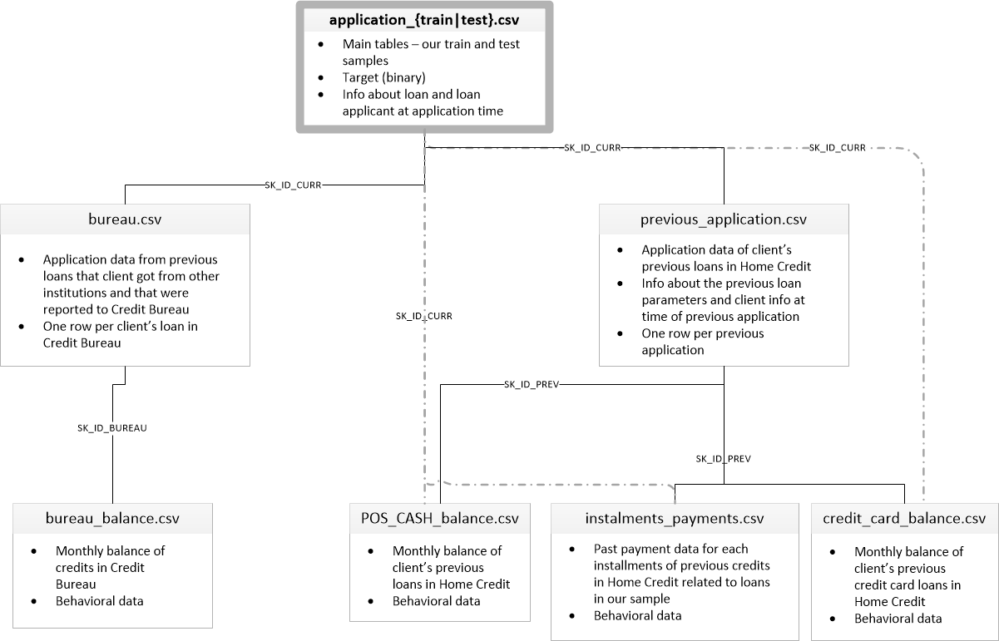

In [4]:
# Lecture des données
train_data = pd.read_csv(os.path.join(path_data, "application_train.csv")).sort_values("SK_ID_CURR")
app_data = pd.read_csv(os.path.join(path_data, "application_test.csv")).sort_values("SK_ID_CURR")
bureau = pd.read_csv(os.path.join(path_data, "bureau.csv")).sort_values(['SK_ID_CURR', 'SK_ID_BUREAU'])
bureau_bal = pd.read_csv(os.path.join(path_data, "bureau_balance.csv")).sort_values("SK_ID_BUREAU")
cash_bal = pd.read_csv(os.path.join(path_data, "POS_CASH_balance.csv")).sort_values(['SK_ID_CURR', 'SK_ID_PREV'])
card_bal = pd.read_csv(os.path.join(path_data, "credit_card_balance.csv")).sort_values(['SK_ID_CURR', 'SK_ID_PREV'])
prev_app = pd.read_csv(os.path.join(path_data, "previous_application.csv")).sort_values(['SK_ID_CURR', 'SK_ID_PREV'])
payments = pd.read_csv(os.path.join(path_data, "installments_payments.csv")).sort_values(['SK_ID_CURR', 'SK_ID_PREV'])

In [5]:
# Description colonnes
desc = pd.read_csv(os.path.join(path_data, "HomeCredit_columns_description.csv"), encoding= 'unicode_escape')
desc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219 entries, 0 to 218
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Unnamed: 0   219 non-null    int64 
 1   Table        219 non-null    object
 2   Row          219 non-null    object
 3   Description  219 non-null    object
 4   Special      86 non-null     object
dtypes: int64(1), object(4)
memory usage: 8.7+ KB


In [6]:
desc

,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Target variable (1 - client with payment diffi...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN
5,8,application_{train|test}.csv,FLAG_OWN_REALTY,Flag if client owns a house or flat,NaN
6,9,application_{train|test}.csv,CNT_CHILDREN,Number of children the client has,NaN
7,10,application_{train|test}.csv,AMT_INCOME_TOTAL,Income of the client,NaN
8,11,application_{train|test}.csv,AMT_CREDIT,Credit amount of the loan,NaN
9,12,application_{train|test}.csv,AMT_ANNUITY,Loan annuity,NaN


In [7]:
desc.replace('SK_BUREAU_ID', 'SK_ID_BUREAU', inplace=True)
desc.replace('SK_ID_PREV ', 'SK_ID_PREV', inplace=True)

## 1. Fichier train

In [8]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 288.6+ MB


In [9]:
print('Le fichier train a {} lignes et {} colonnes.'.format(train_data.shape[0], train_data.shape[1]))

Le fichier train a 307511 lignes et 122 colonnes.


In [10]:
train_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [11]:
def describe_columns_df(df, desc):
    """
    Affiche la description détaillée du contenu de chaque colonne de df
    df(pd.Dataframe): jeu de données
    desc : fichier contenant description
    """
    for col in df:
        print(col)
        # description
        ind = desc[desc['Row'] == col]
        print(ind['Description'].values)
        # print(desc.loc[desc['Row'] == col, 'Description'])
        # valeurs manquantes
        null = df[col].isnull().sum()
        print('NaN : {}, soit {} %'.format(null, 100*null/df.shape[0]))
        # duplicatas
        dupl = df[col].duplicated().sum()
        print('Valeurs dupliquées : {}, soit {} %'.format(dupl, 100*dupl/df.shape[0]))
        print('Valeurs uniques : {}'.format(df[col].nunique()))
        # describe
        print(df[col].describe())
        if df[col].dtype == object:
            print('Categories and Count:')
            print(df[col].value_counts().to_string(header=None))
        print('\n')

In [12]:
describe_columns_df(train_data, desc[0:122])

SK_ID_CURR
['ID of loan in our sample']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 0, soit 0.0 %
Valeurs uniques : 307511
count    307511.000000
mean     278180.518577
std      102790.175348
min      100002.000000
25%      189145.500000
50%      278202.000000
75%      367142.500000
max      456255.000000
Name: SK_ID_CURR, dtype: float64


TARGET
['Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 307509, soit 99.99934961676168 %
Valeurs uniques : 2
count    307511.000000
mean          0.080729
std           0.272419
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: TARGET, dtype: float64


NAME_CONTRACT_TYPE
['Identification if loan is cash or revolving']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 307509, soit 99.99934961676168 %
Valeurs uniq

count    307511.000000
mean          0.999997
std           0.001803
min           0.000000
25%           1.000000
50%           1.000000
75%           1.000000
max           1.000000
Name: FLAG_MOBIL, dtype: float64


FLAG_EMP_PHONE
['Did client provide work phone (1=YES, 0=NO)']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 307509, soit 99.99934961676168 %
Valeurs uniques : 2
count    307511.000000
mean          0.819889
std           0.384280
min           0.000000
25%           1.000000
50%           1.000000
75%           1.000000
max           1.000000
Name: FLAG_EMP_PHONE, dtype: float64


FLAG_WORK_PHONE
['Did client provide home phone (1=YES, 0=NO)']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 307509, soit 99.99934961676168 %
Valeurs uniques : 2
count    307511.000000
mean          0.199368
std           0.399526
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: FLAG_WORK_PHONE, dtype: float64


FLAG_CONT_MOBILE
['

count    127568.000000
mean          0.088442
std           0.082438
min           0.000000
25%           0.044200
50%           0.076300
75%           0.112200
max           1.000000
Name: BASEMENTAREA_AVG, dtype: float64


YEARS_BEGINEXPLUATATION_AVG
['Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor']
NaN : 150007, soit 48.781019215572776 %
Valeurs dupliquées : 307225, soit 99.90699519691978 %
Valeurs uniques : 285
count    157504.000000
mean          0.977735
std           0.059223
min           0.000000
25%           0.976700
50%           0.981600
75%           0.986600
max           1.000000
Name: YEARS_BEGINEXPLUATATION_AVG, dtype: float64


YEARS_BUILD_AVG
['Normalized information about building where the client lives, What is average (_AVG suffix), mod

Valeurs dupliquées : 306750, soit 99.75252917781803 %
Valeurs uniques : 760
count    151450.000000
mean          0.114231
std           0.107936
min           0.000000
25%           0.052500
50%           0.084000
75%           0.143900
max           1.000000
Name: APARTMENTS_MODE, dtype: float64


BASEMENTAREA_MODE
['Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor']
NaN : 179943, soit 58.515955526794166 %
Valeurs dupliquées : 303669, soit 98.75061379918117 %
Valeurs uniques : 3841
count    127568.000000
mean          0.087543
std           0.084307
min           0.000000
25%           0.040700
50%           0.074600
75%           0.112400
max           1.000000
Name: BASEMENTAREA_MODE, dtype: float64


YEARS_BEGINEXPLUATATION_MODE
['Normalized information abou

Valeurs uniques : 3327
count    137829.000000
mean          0.027022
std           0.070254
min           0.000000
25%           0.000000
50%           0.001100
75%           0.023100
max           1.000000
Name: NONLIVINGAREA_MODE, dtype: float64


APARTMENTS_MEDI
['Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor']
NaN : 156061, soit 50.749729277977046 %
Valeurs dupliquées : 306362, soit 99.62635482958333 %
Valeurs uniques : 1148
count    151450.000000
mean          0.117850
std           0.109076
min           0.000000
25%           0.058300
50%           0.086400
75%           0.148900
max           1.000000
Name: APARTMENTS_MEDI, dtype: float64


BASEMENTAREA_MEDI
['Normalized information about building where the client lives, What is average (_AVG suffix),

Valeurs uniques : 214
count    93997.000000
mean         0.008651
std          0.047415
min          0.000000
25%          0.000000
50%          0.000000
75%          0.003900
max          1.000000
Name: NONLIVINGAPARTMENTS_MEDI, dtype: float64


NONLIVINGAREA_MEDI
['Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor']
NaN : 169682, soit 55.17916432257708 %
Valeurs dupliquées : 304187, soit 98.91906305790687 %
Valeurs uniques : 3323
count    137829.000000
mean          0.028236
std           0.070166
min           0.000000
25%           0.000000
50%           0.003100
75%           0.026600
max           1.000000
Name: NONLIVINGAREA_MEDI, dtype: float64


FONDKAPREMONT_MODE
['Normalized information about building where the client lives, What is average (_AVG suffi

count    307511.000000
mean          0.009928
std           0.099144
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: FLAG_DOCUMENT_16, dtype: float64


FLAG_DOCUMENT_17
['Did client provide document 17']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 307509, soit 99.99934961676168 %
Valeurs uniques : 2
count    307511.000000
mean          0.000267
std           0.016327
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: FLAG_DOCUMENT_17, dtype: float64


FLAG_DOCUMENT_18
['Did client provide document 18']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 307509, soit 99.99934961676168 %
Valeurs uniques : 2
count    307511.000000
mean          0.008130
std           0.089798
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: FLAG_DOCUMENT_18, dtype: float64


FLAG_DOCUMENT_19
['Did client pro

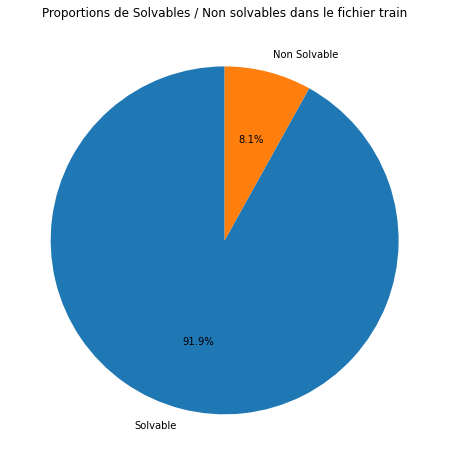

In [13]:
# Target
plt.figure(figsize = (8, 8))
# % de valeurs 'TARGET' différentes
x = train_data['TARGET'].value_counts()/len(train_data)*100
# Pieplot 
plt.pie(x,
        autopct='%1.1f%%',
        labels=["Solvable", "Non Solvable"],
        startangle=90)
plt.title("Proportions de Solvables / Non solvables dans le fichier train")
plt.show()

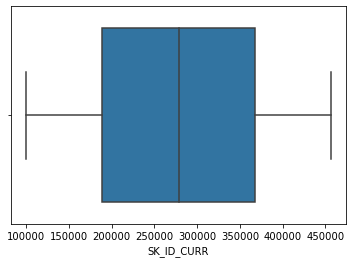

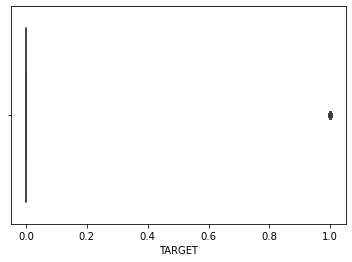

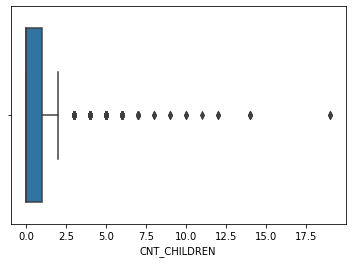

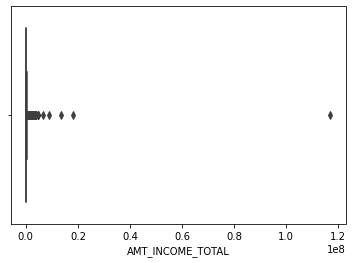

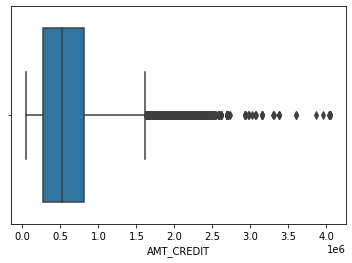

...

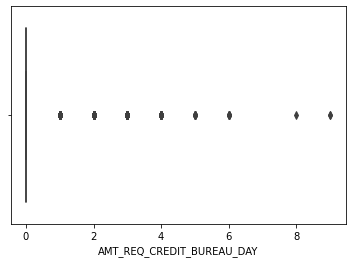

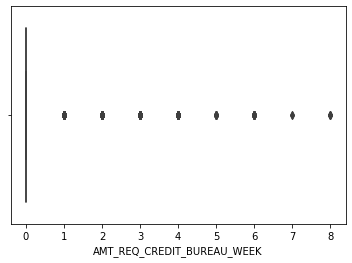

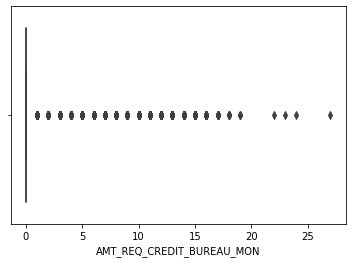

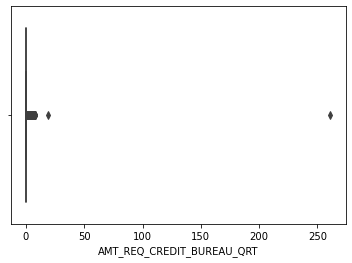

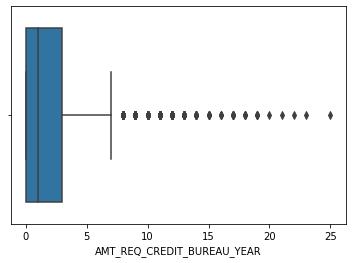

In [14]:
for col in train_data.columns:
    if train_data[col].dtype != object:
        sns.boxplot(x = train_data[col])
        plt.show()

Il semble y avoir des valeurs anormales sur la variable days_employed.
Ces données sont sensées être négatives car selon la description, le point de référence 0 correspond au début du prêt actuel.

In [15]:
# Nombre de valeurs anormales sur les variables DAYS
var_days = []
for col in train_data.columns[train_data.columns.str.contains('DAYS')]:
    x = (train_data[col] > 0).sum()
    if x > 0:
        print(col, 'nb :', x)
        var_days.append(str(col))

DAYS_EMPLOYED nb : 55374


In [16]:
# Visualisation de ses valeurs anormales
train_data.loc[train_data['DAYS_EMPLOYED']> 0, 'DAYS_EMPLOYED']

8         365243
11        365243
23        365243
38        365243
43        365243
           ...  
307469    365243
307483    365243
307487    365243
307505    365243
307507    365243
Name: DAYS_EMPLOYED, Length: 55374, dtype: int64

In [17]:
train_data['DAYS_EMPLOYED'] = train_data['DAYS_EMPLOYED'].replace(365243, np.nan)

## 2. Fichier app_data : Jeu de données non étiquetées

Le modèle de scoring sera, en fin de projet, appliqué sur ce jeu de données non étiquetées.

In [18]:
app_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.4+ MB


In [19]:
print('Le fichier app_data a {} lignes et {} colonnes.'.format(app_data.shape[0], app_data.shape[1]))

Le fichier app_data a 48744 lignes et 121 colonnes.


In [20]:
app_data.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.752614,0.789654,0.159520,0.0660,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.019101,-20038,-4458,-2175.0,-3503,5.0,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.699787,0.610991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,Unaccompanied,Working,Secondary / secondary special,Married

In [21]:
describe_columns_df(app_data, desc[0:122])

SK_ID_CURR
['ID of loan in our sample']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 0, soit 0.0 %
Valeurs uniques : 48744
count     48744.000000
mean     277796.676350
std      103169.547296
min      100001.000000
25%      188557.750000
50%      277549.000000
75%      367555.500000
max      456250.000000
Name: SK_ID_CURR, dtype: float64


NAME_CONTRACT_TYPE
['Identification if loan is cash or revolving']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 48742, soit 99.99589693090432 %
Valeurs uniques : 2
count          48744
unique             2
top       Cash loans
freq           48305
Name: NAME_CONTRACT_TYPE, dtype: object
Categories and Count:
Cash loans         48305
Revolving loans      439


CODE_GENDER
['Gender of the client']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 48742, soit 99.99589693090432 %
Valeurs uniques : 2
count     48744
unique        2
top           F
freq      32678
Name: CODE_GENDER, dtype: object
Categories and Count:
F    32678
M    16066


FLAG_OWN_CAR
['Flag if the clie

Valeurs dupliquées : 48742, soit 99.99589693090432 %
Valeurs uniques : 2
count    48744.000000
mean         0.204702
std          0.403488
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: FLAG_WORK_PHONE, dtype: float64


FLAG_CONT_MOBILE
['Was mobile phone reachable (1=YES, 0=NO)']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 48742, soit 99.99589693090432 %
Valeurs uniques : 2
count    48744.000000
mean         0.998400
std          0.039971
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: FLAG_CONT_MOBILE, dtype: float64


FLAG_PHONE
['Did client provide home phone (1=YES, 0=NO)']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 48742, soit 99.99589693090432 %
Valeurs uniques : 2
count    48744.000000
mean         0.263130
std          0.440337
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: FLAG_

Valeurs uniques : 27207
count    28212.000000
mean         0.501180
std          0.205142
min          0.013458
25%          0.343695
50%          0.506771
75%          0.665956
max          0.939145
Name: EXT_SOURCE_1, dtype: float64


EXT_SOURCE_2
['Normalized score from external data source']
NaN : 8, soit 0.016412276382734285 %
Valeurs dupliquées : 9858, soit 20.224027572624323 %
Valeurs uniques : 38885
count    48736.000000
mean         0.518021
std          0.181278
min          0.000008
25%          0.408066
50%          0.558758
75%          0.658497
max          0.855000
Name: EXT_SOURCE_2, dtype: float64


EXT_SOURCE_3
['Normalized score from external data source']
NaN : 8668, soit 17.782701460692596 %
Valeurs dupliquées : 48041, soit 98.55777121286722 %
Valeurs uniques : 702
count    40076.000000
mean         0.500106
std          0.189498
min          0.000527
25%          0.363945
50%          0.519097
75%          0.652897
max          0.882530
Name: EXT_SOURCE_3, dtype: 

count    16926.000000
mean         0.758327
std          0.110117
min          0.000000
25%          0.692900
50%          0.758300
75%          0.823600
max          1.000000
Name: YEARS_BUILD_MODE, dtype: float64


COMMONAREA_MODE
['Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor']
NaN : 33495, soit 68.71614967996061 %
Valeurs dupliquées : 46742, soit 95.89282783522074 %
Valeurs uniques : 2001
count    15249.000000
mean         0.045223
std          0.081169
min          0.000000
25%          0.007600
50%          0.020300
75%          0.051700
max          1.000000
Name: COMMONAREA_MODE, dtype: float64


ELEVATORS_MODE
['Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) ap

NaN : 23552, soit 48.317741670769735 %
Valeurs dupliquées : 44858, soit 92.02773674708682 %
Valeurs uniques : 3885
count    25192.000000
mean         0.113368
std          0.116503
min          0.000000
25%          0.049000
50%          0.077600
75%          0.137425
max          1.000000
Name: LIVINGAREA_MEDI, dtype: float64


NONLIVINGAPARTMENTS_MEDI
['Normalized information about building where the client lives, What is average (_AVG suffix), modus (_MODE suffix), median (_MEDI suffix) apartment size, common area, living area, age of building, number of elevators, number of entrances, state of the building, number of floor']
NaN : 33347, soit 68.41252256688003 %
Valeurs dupliquées : 48609, soit 99.72304283604136 %
Valeurs uniques : 134
count    15397.000000
mean         0.008979
std          0.048148
min          0.000000
25%          0.000000
50%          0.000000
75%          0.003900
max          1.000000
Name: NONLIVINGAPARTMENTS_MEDI, dtype: float64


NONLIVINGAREA_MEDI
['Norm

count    42695.000000
mean         0.009299
std          0.110924
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          6.000000
Name: AMT_REQ_CREDIT_BUREAU_MON, dtype: float64


AMT_REQ_CREDIT_BUREAU_QRT
['Number of enquiries to Credit Bureau about the client 3 month before application (excluding one month before application)']
NaN : 6049, soit 12.409732479894961 %
Valeurs dupliquées : 48735, soit 99.98153618906943 %
Valeurs uniques : 8
count    42695.000000
mean         0.546902
std          0.693305
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          7.000000
Name: AMT_REQ_CREDIT_BUREAU_QRT, dtype: float64


AMT_REQ_CREDIT_BUREAU_YEAR
['Number of enquiries to Credit Bureau about the client one day year (excluding last 3 months before application)']
NaN : 6049, soit 12.409732479894961 %
Valeurs dupliquées : 48727, soit 99.96512391268669 %
Valeurs uniques : 16
count    42695.000000
mean    

In [22]:
(train_data.columns).isin(app_data.columns).sum()

121

In [23]:
(train_data.columns).drop(app_data.columns)

Index(['TARGET'], dtype='object')

Le fichier app_data contient les mêmes colonnes que le fichier train, sauf la colonne 'Target'.

**Valeurs aberrantes**

In [24]:
var_days = []
for col in app_data.columns[app_data.columns.str.contains('DAYS')]:
    x = (app_data[col] > 0).sum()
    if x > 0:
        if 'bureau'not in col:
            if 'VERSION' not in col:
                print(col, 'nb :', x)
                var_days.append(str(col))

DAYS_EMPLOYED nb : 9274


In [25]:
# remplacer valeurs anormales par nan
app_data['DAYS_EMPLOYED'] = app_data['DAYS_EMPLOYED'].replace(365243, np.nan)

**Variables cat similaires entre train et app_data ?**

In [26]:
# Comparaison CAT entre train et app_data ?
var_catdiff = []
for col in train_data.columns:
    if train_data[col].dtypes == object:
        x = train_data[col].nunique()
        f = train_data[col].unique()
        xT = app_data[col].nunique()
        fT = app_data[col].unique()
        if set(f) != set(fT):
            print(col)
            print(f)
            print(fT)
            var_catdiff.append(col)

CODE_GENDER
['M' 'F' 'XNA']
['F' 'M']
NAME_INCOME_TYPE
['Working' 'State servant' 'Commercial associate' 'Pensioner' 'Unemployed'
 'Student' 'Businessman' 'Maternity leave']
['Working' 'State servant' 'Pensioner' 'Commercial associate'
 'Businessman' 'Student' 'Unemployed']
NAME_FAMILY_STATUS
['Single / not married' 'Married' 'Civil marriage' 'Widow' 'Separated'
 'Unknown']
['Married' 'Single / not married' 'Civil marriage' 'Widow' 'Separated']


In [27]:
for var in var_catdiff:
    print('train', var)
    print(train_data[var].value_counts().to_string(header=None))
    print('app_data', var)
    print(app_data[var].value_counts().to_string(header=None))
    print('')

train CODE_GENDER
F      202448
M      105059
XNA         4
app_data CODE_GENDER
F    32678
M    16066

train NAME_INCOME_TYPE
Working                 158774
Commercial associate     71617
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
app_data NAME_INCOME_TYPE
Working                 24533
Commercial associate    11402
Pensioner                9273
State servant            3532
Student                     2
Unemployed                  1
Businessman                 1

train NAME_FAMILY_STATUS
Married                 196432
Single / not married     45444
Civil marriage           29775
Separated                19770
Widow                    16088
Unknown                      2
app_data NAME_FAMILY_STATUS
Married                 32283
Single / not married     7036
Civil marriage           4261
Separated                2955
Widow                    2209

In [28]:
# nettoyage cat
train_data = train_data[train_data['CODE_GENDER'] != 'XNA']
train_data['NAME_FAMILY_STATUS'] = train_data['NAME_FAMILY_STATUS'].replace('Unknown', 'Single / not married')

## 3. Fichier bureau

In [29]:
bureau.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1716428 entries, 248484 to 1010013
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 235.7+ MB


In [30]:
print('Le fichier bureau a {} lignes et {} colonnes.'.format(bureau.shape[0], bureau.shape[1]))

Le fichier bureau a 1716428 lignes et 17 colonnes.


In [31]:
bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
248484,100001,5896630,Closed,currency 1,-857,0,-492.0,-553.0,NaN,0,112500.0,0.0,0.0,0.0,Consumer credit,-155,0.0
248485,100001,5896631,Closed,currency 1,-909,0,-179.0,-877.0,NaN,0,279720.0,0.0,0.0,0.0,Consumer credit,-155,0.0
248486,100001,5896632,Closed,currency 1,-879,0,-514.0,-544.0,NaN,0,91620.0,0.0,0.0,0.0,Consumer credit,-155,0.0
248487,100001,5896633,Closed,currency 1,-1572,0,-1329.0,-1328.0,NaN,0,85500.0,0.0,0.0,0.0,Consumer credit,-155,0.0
248488,100001,5896634,Active,currency 1,-559,0,902.0,NaN,NaN,0,337680.0,113166.0,0.0,0.0,Consumer credit,-6,4630.5


In [32]:
describe_columns_df(bureau, desc[122:139])

SK_ID_CURR
['ID of loan in our sample - one loan in our sample can have 0,1,2 or more related previous credits in credit bureau ']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 1410617, soit 82.18328994866083 %
Valeurs uniques : 305811
count    1.716428e+06
mean     2.782149e+05
std      1.029386e+05
min      1.000010e+05
25%      1.888668e+05
50%      2.780550e+05
75%      3.674260e+05
max      4.562550e+05
Name: SK_ID_CURR, dtype: float64


SK_ID_BUREAU
['Recoded ID of previous Credit Bureau credit related to our loan (unique coding for each loan application)']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 0, soit 0.0 %
Valeurs uniques : 1716428
count    1.716428e+06
mean     5.924434e+06
std      5.322657e+05
min      5.000000e+06
25%      5.463954e+06
50%      5.926304e+06
75%      6.385681e+06
max      6.843457e+06
Name: SK_ID_BUREAU, dtype: float64


CREDIT_ACTIVE
['Status of the Credit Bureau (CB) reported credits']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 1716424, soit 99.99976695789162 

In [33]:
train_data["SK_ID_CURR"].nunique()

307507

In [34]:
bureau["SK_ID_CURR"].nunique()

305811

In [35]:
# cohérence ID entre train data et bureau
(pd.DataFrame(train_data["SK_ID_CURR"].unique())).isin(bureau["SK_ID_CURR"].unique()).sum()

0    263487
dtype: int64

In [36]:
nb_id = len(np.intersect1d(train_data["SK_ID_CURR"].unique(),
                           bureau["SK_ID_CURR"].unique()))
print('Pourcentage de train ID_CURR disponibles dans le fichier bureau : {} %'
     .format(nb_id/train_data["SK_ID_CURR"].nunique()*100))

Pourcentage de train ID_CURR disponibles dans le fichier bureau : 85.68487871820804 %


In [37]:
nb_idT = len(np.intersect1d(app_data["SK_ID_CURR"].unique(),
                            bureau["SK_ID_CURR"].unique()))
print('Pourcentage de app_data ID_CURR disponibles dans le fichier bureau : {} %'
     .format(nb_idT/app_data["SK_ID_CURR"].nunique()*100))

Pourcentage de app_data ID_CURR disponibles dans le fichier bureau : 86.82094206466437 %


## 4. Fichier bureau_balance

In [38]:
bureau_bal.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27299925 entries, 26079760 to 23544026
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 833.1+ MB


In [39]:
print('Le fichier bureau_balance a {} lignes et {} colonnes.'
      .format(bureau_bal.shape[0], bureau_bal.shape[1]))

Le fichier bureau_balance a 27299925 lignes et 3 colonnes.


In [40]:
bureau_bal.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
26079760,5001709,-7,C
26079756,5001709,-3,C
26079757,5001709,-4,C
26079758,5001709,-5,C
26079759,5001709,-6,C


In [41]:
describe_columns_df(bureau_bal, desc[139:143])

SK_ID_BUREAU
['Recoded ID of Credit Bureau credit (unique coding for each application) - use this to join to CREDIT_BUREAU table ']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 26482530, soit 97.00587089524971 %
Valeurs uniques : 817395
count    2.729992e+07
mean     6.036297e+06
std      4.923489e+05
min      5.001709e+06
25%      5.730933e+06
50%      6.070821e+06
75%      6.431951e+06
max      6.842888e+06
Name: SK_ID_BUREAU, dtype: float64


MONTHS_BALANCE
['Month of balance relative to application date (-1 means the freshest balance date)']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 27299828, soit 99.99964468766855 %
Valeurs uniques : 97
count    2.729992e+07
mean    -3.074169e+01
std      2.386451e+01
min     -9.600000e+01
25%     -4.600000e+01
50%     -2.500000e+01
75%     -1.100000e+01
max      0.000000e+00
Name: MONTHS_BALANCE, dtype: float64


STATUS
['Status of Credit Bureau loan during the month (active, closed, DPD0-30,\x85 [C means closed, X means status unknown, 0 means no DPD

In [42]:
bureau["SK_ID_BUREAU"].nunique()

1716428

In [43]:
bureau_bal["SK_ID_BUREAU"].nunique()

817395

In [44]:
(pd.DataFrame(bureau_bal["SK_ID_BUREAU"].unique())).isin(bureau["SK_ID_BUREAU"].unique()).sum()

0    774354
dtype: int64

In [45]:
nb_id_bur = len(np.intersect1d(bureau_bal["SK_ID_BUREAU"].unique(),
                               bureau["SK_ID_BUREAU"].unique()))
print('Pourcentage de bureau ID_BUR disponibles dans le fichier bureau_bal : {} %'
     .format(nb_id_bur/bureau["SK_ID_BUREAU"].nunique()*100))

Pourcentage de bureau ID_BUR disponibles dans le fichier bureau_bal : 45.114272197843434 %


## 5. Fichier prev_app

In [46]:
prev_app.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1670214 entries, 201668 to 1411592
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 n

In [47]:
print('Le fichier prev_app a {} lignes et {} colonnes.'
      .format(prev_app.shape[0], prev_app.shape[1]))

Le fichier prev_app a 1670214 lignes et 37 colonnes.


In [48]:
prev_app.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
201668,1369693,100001,Consumer loans,3951.000,24835.5,23787.0,2520.0,24835.5,FRIDAY,13,Y,1,0.104326,NaN,NaN,XAP,Approved,-1740,Cash through the bank,XAP,Family,Refreshed,Mobile,POS,XNA,Country-wide,23,Connectivity,8.0,high,POS mobile with interest,365243.0,-1709.0,-1499.0,-1619.0,-1612.0,0.0
892077,1038818,100002,Consumer loans,9251.775,179055.0,179055.0,0.0,179055.0,SATURDAY,9,Y,1,0.000000,NaN,NaN,XAP,Approved,-606,XNA,XAP,NaN,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0
575941,1810518,100003,Cash loans,98356.995,900000.0,1035882.0,NaN,900000.0,FRIDAY,12,Y,1,NaN,NaN,NaN,XNA,Approved,-746,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-716.0,-386.0,-536.0,-527.0,1.0
1223745,2396755,100003,Consumer loans,6737.310,68809.5,68053.5,6885.0,68809.5,SATURDAY,15,Y,1,0.100061,NaN,NaN,XAP,Approved,-2341,Cash through the bank,XAP,Family,Refreshed,Consumer Electronics,POS,XNA,Country-wide,200,Consumer electronics,12.0,middle,POS household with interest,365243.0,-2310.0,-1980.0,-1980.0,-1976.0,1.0
1021650,2636178,100003,Consumer loans,64567.665,337500.0,348637.5,0.0,337500.0,SUNDAY,17,Y,1,0.000000,NaN,NaN,XAP,Approved,-828,Cash through the bank,XAP,Family,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.0,middle,POS industry with interest,365243.0,-797.0,-647.0,-647.0,-639.0,0.0


In [49]:
describe_columns_df(prev_app, desc[170:211])

SK_ID_PREV
['ID of previous credit in Home credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loan applications in Home Credit, previous application could, but not necessarily have to lead to credit) ']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 0, soit 0.0 %
Valeurs uniques : 1670214
count    1.670214e+06
mean     1.923089e+06
std      5.325980e+05
min      1.000001e+06
25%      1.461857e+06
50%      1.923110e+06
75%      2.384280e+06
max      2.845382e+06
Name: SK_ID_PREV, dtype: float64


SK_ID_CURR
['ID of loan in our sample']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 1331357, soit 79.71176148685139 %
Valeurs uniques : 338857
count    1.670214e+06
mean     2.783572e+05
std      1.028148e+05
min      1.000010e+05
25%      1.893290e+05
50%      2.787145e+05
75%      3.675140e+05
max      4.562550e+05
Name: SK_ID_CURR, dtype: float64


NAME_CONTRACT_TYPE
['Contract product type (Cash loan, consumer loan [POS] ,...) of the previous application']


Valeurs uniques : 4
count      1670214
unique           4
top       Approved
freq       1036781
Name: NAME_CONTRACT_STATUS, dtype: object
Categories and Count:
Approved        1036781
Canceled         316319
Refused          290678
Unused offer      26436


DAYS_DECISION
['Relative to current application when was the decision about previous application made']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 1667292, soit 99.82505235856004 %
Valeurs uniques : 2922
count    1.670214e+06
mean    -8.806797e+02
std      7.790997e+02
min     -2.922000e+03
25%     -1.300000e+03
50%     -5.810000e+02
75%     -2.800000e+02
max     -1.000000e+00
Name: DAYS_DECISION, dtype: float64


NAME_PAYMENT_TYPE
['Payment method that client chose to pay for the previous application']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 1670210, soit 99.99976050973109 %
Valeurs uniques : 4
count                   1670214
unique                        4
top       Cash through the bank
freq                    1033552
Name: NAME_P

Valeurs uniques : 2892
count    997149.000000
mean      13826.269337
std       72444.869708
min       -2892.000000
25%       -1628.000000
50%        -831.000000
75%        -411.000000
max      365243.000000
Name: DAYS_FIRST_DUE, dtype: float64


DAYS_LAST_DUE_1ST_VERSION
['Relative to application date of current application when was the first due of the previous application']
NaN : 673065, soit 40.29812946125467 %
Valeurs dupliquées : 1665608, soit 99.72422695534824 %
Valeurs uniques : 4605
count    997149.000000
mean      33767.774054
std      106857.034789
min       -2801.000000
25%       -1242.000000
50%        -361.000000
75%         129.000000
max      365243.000000
Name: DAYS_LAST_DUE_1ST_VERSION, dtype: float64


DAYS_LAST_DUE
['Relative to application date of current application when was the last due date of the previous application']
NaN : 673065, soit 40.29812946125467 %
Valeurs dupliquées : 1667340, soit 99.82792624178698 %
Valeurs uniques : 2873
count    997149.000000
mean 

In [50]:
# cohérence avec train et app_data
nb_id = len(np.intersect1d(train_data["SK_ID_CURR"].unique(),
                           prev_app["SK_ID_CURR"].unique()))
print('Pourcentage de train ID_CURR disponibles dans le fichier prev_app : {} %'
     .format(nb_id/train_data["SK_ID_CURR"].nunique()*100))

Pourcentage de train ID_CURR disponibles dans le fichier prev_app : 94.64922749726023 %


In [51]:
nb_idT = len(np.intersect1d(app_data["SK_ID_CURR"].unique(),
                            prev_app["SK_ID_CURR"].unique()))
print('Pourcentage de app_data ID_CURR disponibles dans le fichier prev_app : {} %'
     .format(nb_idT/app_data["SK_ID_CURR"].nunique()*100))

Pourcentage de app_data ID_CURR disponibles dans le fichier prev_app : 98.06335138683735 %


In [52]:
# cohérence avec bureau
nb_idBP = len(np.intersect1d(bureau["SK_ID_CURR"].unique(),
                            prev_app["SK_ID_CURR"].unique()))
print('Pourcentage de bureau ID_CURR disponibles dans le fichier prev_app : {} %'
     .format(nb_idBP/prev_app["SK_ID_CURR"].nunique()*100))


Pourcentage de bureau ID_CURR disponibles dans le fichier prev_app : 85.90378832368816 %


In [53]:
# nb de valeurs abnormales 
var_days = []
for col in prev_app.columns[prev_app.columns.str.contains('DAYS')]:
    if prev_app[col].dtypes != object:
        x = (prev_app[col] > 0).sum()
        if x > 0:
            if "VERSION" not in col:
                print(col, 'nb :', x)
                var_days.append(str(col))

DAYS_FIRST_DRAWING nb : 934444
DAYS_FIRST_DUE nb : 40645
DAYS_LAST_DUE nb : 211221
DAYS_TERMINATION nb : 225913


In [54]:
# remplacer valeurs anormales par nan
for col in var_days:
    prev_app[col] = prev_app[col].replace(365243, np.nan)

## 6. Fichier cash_bal

In [55]:
cash_bal.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10001358 entries, 2197888 to 8606094
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             int64  
 1   SK_ID_CURR             int64  
 2   MONTHS_BALANCE         int64  
 3   CNT_INSTALMENT         float64
 4   CNT_INSTALMENT_FUTURE  float64
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int64  
 7   SK_DPD_DEF             int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 686.7+ MB


In [56]:
print('Le fichier cash_bal a {} lignes et {} colonnes.'
      .format(cash_bal.shape[0], cash_bal.shape[1]))

Le fichier cash_bal a 10001358 lignes et 8 colonnes.


In [57]:
cash_bal.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
2197888,1369693,100001,-53,4.0,0.0,Completed,0,0
4704415,1369693,100001,-54,4.0,1.0,Active,0,0
7167007,1369693,100001,-57,4.0,4.0,Active,0,0
7823681,1369693,100001,-55,4.0,2.0,Active,0,0
8789081,1369693,100001,-56,4.0,3.0,Active,0,0


In [58]:
describe_columns_df(cash_bal, desc[142:150])

SK_ID_PREV
['ID of previous credit in Home Credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loans in Home Credit)']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 9065033, soit 90.63802135669977 %
Valeurs uniques : 936325
count    1.000136e+07
mean     1.903217e+06
std      5.358465e+05
min      1.000001e+06
25%      1.434405e+06
50%      1.896565e+06
75%      2.368963e+06
max      2.843499e+06
Name: SK_ID_PREV, dtype: float64


SK_ID_CURR
['ID of loan in our sample']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 9664106, soit 96.62793792602965 %
Valeurs uniques : 337252
count    1.000136e+07
mean     2.784039e+05
std      1.027637e+05
min      1.000010e+05
25%      1.895500e+05
50%      2.786540e+05
75%      3.674290e+05
max      4.562550e+05
Name: SK_ID_CURR, dtype: float64


MONTHS_BALANCE
['Month of balance relative to application date (-1 means the information to the freshest monthly snapshot, 0 means the information at application - often it will

In [59]:
# cohérence avec train et app_data
nb_id = len(np.intersect1d(train_data["SK_ID_CURR"].unique(),
                           cash_bal["SK_ID_CURR"].unique()))
print('Pourcentage de train ID_CURR disponibles dans le fichier cash_bal : {} %'
     .format(nb_id/train_data["SK_ID_CURR"].nunique()*100))

Pourcentage de train ID_CURR disponibles dans le fichier cash_bal : 94.12468659250032 %


In [60]:
nb_idT = len(np.intersect1d(app_data["SK_ID_CURR"].unique(),
                            cash_bal["SK_ID_CURR"].unique()))
print('Pourcentage de test ID_CURR disponibles dans le fichier cash_bal : {} %'
     .format(nb_idT/app_data["SK_ID_CURR"].nunique()*100))

Pourcentage de test ID_CURR disponibles dans le fichier cash_bal : 98.07976366322009 %


In [61]:
# cohérence avec bureau
nb_idBC = len(np.intersect1d(bureau["SK_ID_CURR"].unique(),
                             cash_bal["SK_ID_CURR"].unique()))
print('Pourcentage de bureau ID_CURR disponibles dans le fichier cash_bal : {} %'
     .format(nb_idBC/cash_bal["SK_ID_CURR"].nunique()*100))

Pourcentage de bureau ID_CURR disponibles dans le fichier cash_bal : 85.93811156049482 %


## 7. Fichier payments

In [62]:
payments.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13605401 entries, 1478621 to 12567314
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 934.2 MB


In [63]:
print('Le fichier payments a {} lignes et {} colonnes.'
      .format(payments.shape[0], payments.shape[1]))

Le fichier payments a 13605401 lignes et 8 colonnes.


In [64]:
payments.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
1478621,1369693,100001,1.0,1,-1709.0,-1715.0,3951.00,3951.00
2568722,1369693,100001,1.0,2,-1679.0,-1715.0,3951.00,3951.00
2624024,1369693,100001,2.0,4,-1619.0,-1628.0,17397.90,17397.90
3458712,1369693,100001,1.0,3,-1649.0,-1660.0,3951.00,3951.00
1761012,1851984,100001,1.0,2,-2916.0,-2916.0,3982.05,3982.05


In [65]:
describe_columns_df(payments, desc[211:])

SK_ID_PREV
['ID of previous credit in Home credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loans in Home Credit)']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 12607649, soit 92.66650060516407 %
Valeurs uniques : 997752
count    1.360540e+07
mean     1.903365e+06
std      5.362029e+05
min      1.000001e+06
25%      1.434191e+06
50%      1.896520e+06
75%      2.369094e+06
max      2.843499e+06
Name: SK_ID_PREV, dtype: float64


SK_ID_CURR
['ID of loan in our sample']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 13265814, soit 97.50402799594073 %
Valeurs uniques : 339587
count    1.360540e+07
mean     2.784449e+05
std      1.027183e+05
min      1.000010e+05
25%      1.896390e+05
50%      2.786850e+05
75%      3.675300e+05
max      4.562550e+05
Name: SK_ID_CURR, dtype: float64


NUM_INSTALMENT_VERSION
['Version of installment calendar (0 is for credit card) of previous credit. Change of installment version from month to month signifies that some param

In [66]:
# cohérence avec train et app_data
nb_id = len(np.intersect1d(train_data["SK_ID_CURR"].unique(),
                           payments["SK_ID_CURR"].unique()))
print('Pourcentage de train ID_CURR disponibles dans le fichier payments : {} %'
     .format(nb_id/train_data["SK_ID_CURR"].nunique()*100))

Pourcentage de train ID_CURR disponibles dans le fichier payments : 94.83979226489153 %


In [67]:
nb_idT = len(np.intersect1d(app_data["SK_ID_CURR"].unique(),
                            payments["SK_ID_CURR"].unique()))
print('Pourcentage de app_data ID_CURR disponibles dans le fichier payments : {} %'
     .format(nb_idT/app_data["SK_ID_CURR"].nunique()*100))

Pourcentage de app_data ID_CURR disponibles dans le fichier payments : 98.35877236172658 %


In [68]:
# cohérence avec bureau
nb_idBC = len(np.intersect1d(bureau["SK_ID_CURR"].unique(),
                             payments["SK_ID_CURR"].unique()))
print('Pourcentage de bureau ID_CURR disponibles dans le fichier payments : {} %'
     .format(nb_idBC/payments["SK_ID_CURR"].nunique()*100))

Pourcentage de bureau ID_CURR disponibles dans le fichier payments : 85.89963691189591 %


In [69]:
# Nombre de valeurs abnormales variables days
var_days = []
for col in payments.columns[payments.columns.str.contains('DAYS')]:
    if payments[col].dtypes != object:
        x = (payments[col] > 0).sum()
        if x > 0:
            print(col, 'nb :', x)
            var_days.append(str(col))

Pas de valeurs anormales sur les variables jours.

## 8. Fichier card_bal

In [70]:
card_bal.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3840312 entries, 520387 to 3734047
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_PREV                  int64  
 1   SK_ID_CURR                  int64  
 2   MONTHS_BALANCE              int64  
 3   AMT_BALANCE                 float64
 4   AMT_CREDIT_LIMIT_ACTUAL     int64  
 5   AMT_DRAWINGS_ATM_CURRENT    float64
 6   AMT_DRAWINGS_CURRENT        float64
 7   AMT_DRAWINGS_OTHER_CURRENT  float64
 8   AMT_DRAWINGS_POS_CURRENT    float64
 9   AMT_INST_MIN_REGULARITY     float64
 10  AMT_PAYMENT_CURRENT         float64
 11  AMT_PAYMENT_TOTAL_CURRENT   float64
 12  AMT_RECEIVABLE_PRINCIPAL    float64
 13  AMT_RECIVABLE               float64
 14  AMT_TOTAL_RECEIVABLE        float64
 15  CNT_DRAWINGS_ATM_CURRENT    float64
 16  CNT_DRAWINGS_CURRENT        int64  
 17  CNT_DRAWINGS_OTHER_CURRENT  float64
 18  CNT_DRAWINGS_POS_CURRENT    float64
 19  CNT_INSTALMENT_M

In [71]:
print('Le fichier card_bal a {} lignes et {} colonnes.'
      .format(card_bal.shape[0], card_bal.shape[1]))

Le fichier card_bal a 3840312 lignes et 23 colonnes.


In [72]:
card_bal.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
520387,1489396,100006,-2,0.0,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,0.0,Active,0,0
584804,1489396,100006,-1,0.0,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,0.0,Active,0,0
655566,1489396,100006,-5,0.0,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,0.0,Active,0,0
1347528,1489396,100006,-3,0.0,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,0.0,Active,0,0
1399895,1489396,100006,-4,0.0,270000,NaN,0.0,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,0.0,Active,0,0


In [73]:
describe_columns_df(card_bal, desc[150:173])

SK_ID_PREV
['ID of previous credit in Home credit related to loan in our sample. (One loan in our sample can have 0,1,2 or more previous loans in Home Credit)']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 3736005, soit 97.2838925587296 %
Valeurs uniques : 104307
count    3.840312e+06
mean     1.904504e+06
std      5.364695e+05
min      1.000018e+06
25%      1.434385e+06
50%      1.897122e+06
75%      2.369328e+06
max      2.843496e+06
Name: SK_ID_PREV, dtype: float64


SK_ID_CURR
['ID of loan in our sample']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 3736754, soit 97.30339618239351 %
Valeurs uniques : 103558
count    3.840312e+06
mean     2.783242e+05
std      1.027045e+05
min      1.000060e+05
25%      1.895170e+05
50%      2.783960e+05
75%      3.675800e+05
max      4.562500e+05
Name: SK_ID_CURR, dtype: float64


MONTHS_BALANCE
['Month of balance relative to application date (-1 means the freshest balance date)']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 3840216, soit 99.9975002031085 %
Va

Valeurs uniques : 7
count     3840312
unique          7
top        Active
freq      3698436
Name: NAME_CONTRACT_STATUS, dtype: object
Categories and Count:
Active           3698436
Completed         128918
Signed             11058
Demand              1365
Sent proposal        513
Refused               17
Approved               5


SK_DPD
['DPD (Days past due) during the month on the previous credit']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 3839395, soit 99.97612173177596 %
Valeurs uniques : 917
count    3.840312e+06
mean     9.283667e+00
std      9.751570e+01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      3.260000e+03
Name: SK_DPD, dtype: float64


SK_DPD_DEF
['DPD (Days past due) during the month with tolerance (debts with low loan amounts are ignored) of the previous credit']
NaN : 0, soit 0.0 %
Valeurs dupliquées : 3839934, soit 99.99015704973971 %
Valeurs uniques : 378
count    3.840312e+06
mean     3.316220e-01
std      2.147923e+

In [74]:
# cohérence avec train et app_data
nb_id = len(np.intersect1d(train_data["SK_ID_CURR"].unique(),
                           card_bal["SK_ID_CURR"].unique()))
print('Pourcentage de train ID_CURR disponibles dans le fichier card_bal : {} %'
     .format(nb_id/train_data["SK_ID_CURR"].nunique()*100))

Pourcentage de train ID_CURR disponibles dans le fichier card_bal : 28.26114527474171 %


In [75]:
nb_idT = len(np.intersect1d(app_data["SK_ID_CURR"].unique(),
                            card_bal["SK_ID_CURR"].unique()))
print('Pourcentage de test ID_CURR disponibles dans le fichier card_bal : {} %'
     .format(nb_idT/app_data["SK_ID_CURR"].nunique()*100))

Pourcentage de test ID_CURR disponibles dans le fichier card_bal : 34.164204825209254 %


In [76]:
# cohérence avec bureau
nb_idBC = len(np.intersect1d(bureau["SK_ID_CURR"].unique(),
                             card_bal["SK_ID_CURR"].unique()))
print('Pourcentage de bureau ID_CURR disponibles dans le fichier card_bal : {} %'
     .format(nb_idBC/payments["SK_ID_CURR"].nunique()*100))

Pourcentage de bureau ID_CURR disponibles dans le fichier card_bal : 26.48216804530209 %


# II. Création de la table de données et Feature Engineering

## 1. Relations entre les dataframes

In [77]:
# Création "EntitySet"
ent = ft.EntitySet(id='train')
# Add dataframe to entityset
ent = ent.entity_from_dataframe(entity_id='train',
                              dataframe=train_data,
                              index='SK_ID_CURR')
# Affiche le type de chaque colonne
ent['train']

Entity: train
  Variables:
    SK_ID_CURR (dtype: index)
    TARGET (dtype: numeric)
    NAME_CONTRACT_TYPE (dtype: categorical)
    CODE_GENDER (dtype: categorical)
    FLAG_OWN_CAR (dtype: categorical)
    FLAG_OWN_REALTY (dtype: categorical)
    CNT_CHILDREN (dtype: numeric)
    AMT_INCOME_TOTAL (dtype: numeric)
    AMT_CREDIT (dtype: numeric)
    AMT_ANNUITY (dtype: numeric)
    AMT_GOODS_PRICE (dtype: numeric)
    NAME_TYPE_SUITE (dtype: categorical)
    NAME_INCOME_TYPE (dtype: categorical)
    NAME_EDUCATION_TYPE (dtype: categorical)
    NAME_FAMILY_STATUS (dtype: categorical)
    NAME_HOUSING_TYPE (dtype: categorical)
    REGION_POPULATION_RELATIVE (dtype: numeric)
    DAYS_BIRTH (dtype: numeric)
    DAYS_EMPLOYED (dtype: numeric)
    DAYS_REGISTRATION (dtype: numeric)
    DAYS_ID_PUBLISH (dtype: numeric)
    OWN_CAR_AGE (dtype: numeric)
    FLAG_MOBIL (dtype: numeric)
    FLAG_EMP_PHONE (dtype: numeric)
    FLAG_WORK_PHONE (dtype: numeric)
    FLAG_CONT_MOBILE (dtype: numeric)

In [78]:
ID = ft.variable_types.Id

# Add bureau dataframe to entityset
ent = ent.entity_from_dataframe(
      entity_id='bureau',
      dataframe=bureau,
      index='New',
      variable_types={'SK_ID_CURR': ID})

# Add cash_balance dataframe to entityset
ent = ent.entity_from_dataframe(
      entity_id='cash_balance', 
      dataframe=cash_bal,
      index='New',
      variable_types={'SK_ID_PREV': ID,
                    'SK_ID_CURR': ID})


# Add prev_app dataframe to entityset
ent = ent.entity_from_dataframe(
      entity_id='prev_app',
      dataframe=prev_app,
      index='New',
      variable_types={'SK_ID_CURR': ID})

# Add payments dataframe to entityset
ent = ent.entity_from_dataframe(
      entity_id='payments',
      dataframe=payments,
      index='New',
      variable_types={'SK_ID_PREV': ID,
                    'SK_ID_CURR': ID})

/Users/charlottepostel/opt/anaconda3/lib/python3.8/site-packages/featuretools/entityset/entity.py:462: UserWarning: index New not found in dataframe, creating new integer column
  warnings.warn("index {} not found in dataframe, creating new "


In [79]:
# Relations entre dataframes
relationships = [
# parent_entity   parent_variable  child_entity child_variable
  ('train', 'SK_ID_CURR',    'bureau',         'SK_ID_CURR'),
  ('train', 'SK_ID_CURR',    'prev_app',       'SK_ID_CURR'),
  ('train', 'SK_ID_CURR',    'cash_balance',   'SK_ID_CURR'),
  ('train', 'SK_ID_CURR',    'payments',       'SK_ID_CURR')]

for pe, pv, ce, cv in relationships:
    ent = ent.add_relationship(ft.Relationship(ent[pe][pv], ent[ce][cv]))

In [80]:
#ent.plot()

## 2. Table et Feature Engineering

In [81]:
df_train, df_trainf = ft.dfs(entityset=ent,
                        target_entity='train',
                        agg_primitives=['count', 'mean', 'min', 'max'],
                        drop_contains=["ID_PREV", "ID_BUREAU"],
                        verbose=True)

Built 251 features
Elapsed: 00:36 | Progress: 100%|██████████


In [82]:
df_trainf

[<Feature: TARGET>,
 <Feature: NAME_CONTRACT_TYPE>,
 <Feature: CODE_GENDER>,
 <Feature: FLAG_OWN_CAR>,
 <Feature: FLAG_OWN_REALTY>,
 <Feature: CNT_CHILDREN>,
 <Feature: AMT_INCOME_TOTAL>,
 <Feature: AMT_CREDIT>,
 <Feature: AMT_ANNUITY>,
 <Feature: AMT_GOODS_PRICE>,
 <Feature: NAME_TYPE_SUITE>,
 <Feature: NAME_INCOME_TYPE>,
 <Feature: NAME_EDUCATION_TYPE>,
 <Feature: NAME_FAMILY_STATUS>,
 <Feature: NAME_HOUSING_TYPE>,
 <Feature: REGION_POPULATION_RELATIVE>,
 <Feature: DAYS_BIRTH>,
 <Feature: DAYS_EMPLOYED>,
 <Feature: DAYS_REGISTRATION>,
 <Feature: DAYS_ID_PUBLISH>,
 <Feature: OWN_CAR_AGE>,
 <Feature: FLAG_MOBIL>,
 <Feature: FLAG_EMP_PHONE>,
 <Feature: FLAG_WORK_PHONE>,
 <Feature: FLAG_CONT_MOBILE>,
 <Feature: FLAG_PHONE>,
 <Feature: FLAG_EMAIL>,
 <Feature: OCCUPATION_TYPE>,
 <Feature: CNT_FAM_MEMBERS>,
 <Feature: REGION_RATING_CLIENT>,
 <Feature: REGION_RATING_CLIENT_W_CITY>,
 <Feature: WEEKDAY_APPR_PROCESS_START>,
 <Feature: HOUR_APPR_PROCESS_START>,
 <Feature: REG_REGION_NOT_LIVE_REG

## 3. Feature Engineering manuel

Ajout de variables spécifiques au domaine bancaire. 
FE inspiré des kernels vus sur kaggle.

In [83]:
def manual_fe(df) :
    df['PROPORTION_LIFE_EMPLOYED'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_TO_CREDIT_RATIO'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT'] 
    df['INCOME_TO_ANNUITY_RATIO'] = df['AMT_INCOME_TOTAL'] / df['AMT_ANNUITY']
    df['INCOME_TO_ANNUITY_RATIO_BY_AGE'] = df['INCOME_TO_ANNUITY_RATIO'] * df['DAYS_BIRTH']
    df['CREDIT_TO_ANNUITY_RATIO'] = df['AMT_CREDIT'] / df['AMT_ANNUITY']
    df['CREDIT_TO_ANNUITY_RATIO_BY_AGE'] = df['CREDIT_TO_ANNUITY_RATIO'] * df['DAYS_BIRTH']
    df['INCOME_TO_FAMILYSIZE_RATIO'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    return df

In [84]:
df_train = manual_fe(df_train)

In [85]:
df_train.shape

(307507, 258)

## 4. Suppression de variables avec beaucoup de valeurs manquantes

In [86]:
# retire variables si > 1/3 de NaN
df_train2 = selection.remove_highly_null_features(df_train, pct_null_threshold=.33)
print("Le nombre de variables est de {}".format(len(df_train2.columns)))

Le nombre de variables est de 194


In [87]:
var = df_train2.columns.values

In [88]:
var_drop_n = (df_train.columns).drop(df_train2.columns.values)

In [89]:
# Noms des variables retirées
var_drop_n

Index(['OWN_CAR_AGE', 'EXT_SOURCE_1', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG',
       'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG',
       'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG',
       'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG',
       'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE',
       'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE',
       'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE',
       'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE',
       'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE',
       'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI',
       'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI',
       'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMIN_MEDI', 'LANDAREA_MEDI',
       'LIVINGAPARTMENTS_MEDI', 'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI',
       'NONLIVINGAREA_MEDI', 'FO

## 5. Création de la table pour les données application non étiquetées

In [90]:
# Create an entity set
ent_T = ft.EntitySet(id='app')
# Add dataframe to entityset
ent_T = ent_T .entity_from_dataframe(entity_id='app',
                              dataframe=app_data,
                              index='SK_ID_CURR')
# Add bureau dataframe to entityset
ent_T = ent_T.entity_from_dataframe(
      entity_id='bureau',
      dataframe=bureau,
      index='New',
      variable_types={'SK_ID_CURR': ID})

# Add cash_balance dataframe to entityset
ent_T = ent_T.entity_from_dataframe(
      entity_id='cash_balance', 
      dataframe=cash_bal,
      index='New',
      variable_types={'SK_ID_PREV': ID,
                    'SK_ID_CURR': ID})


# Add prev_app dataframe to entityset
ent_T = ent_T.entity_from_dataframe(
      entity_id='prev_app',
      dataframe=prev_app,
      index='New',
      variable_types={'SK_ID_CURR': ID})

# Add payments dataframe to entityset
ent_T = ent_T.entity_from_dataframe(
      entity_id='payments',
      dataframe=payments,
      index='New',
      variable_types={'SK_ID_PREV': ID,
                    'SK_ID_CURR': ID})

# Define relationships between dataframes
relationshipsT = [
  # parent_entity   parent_variable  child_entity      child_variable
  ('app', 'SK_ID_CURR',    'bureau',         'SK_ID_CURR'),
  ('app', 'SK_ID_CURR',    'prev_app',       'SK_ID_CURR'),
  ('app', 'SK_ID_CURR',    'cash_balance',   'SK_ID_CURR'),
  ('app', 'SK_ID_CURR',    'payments',       'SK_ID_CURR')]

# Create the relationships
for pe, pv, ce, cv in relationshipsT:
    ent_T = ent_T.add_relationship(ft.Relationship(ent_T[pe][pv], ent_T[ce][cv]))

In [91]:
df_app, df_appf = ft.dfs(entityset=ent_T,
                        target_entity='app',
                        agg_primitives=['count', 'mean', 'min', 'max'],
                        drop_contains=["ID_PREV", "ID_BUREAU"],
                        verbose=True)

Built 250 features
Elapsed: 00:08 | Progress: 100%|██████████


In [92]:
df_app = manual_fe(df_app)
df_app.shape

(48744, 257)

In [95]:
# df app avec fe et sans var > .33 NaN
df_app2 = df_app.loc[:, df_app.columns.isin(df_train2.columns)]
df_app2.shape

(48744, 193)

In [96]:
# Vérif si variables similaires
(df_train2.columns.drop('TARGET') == df_app2.columns).sum()

193

In [102]:
# vérif variables si > 1/3 de NaN
essai = selection.remove_highly_null_features(df_app2, pct_null_threshold=.33)
print("Le nombre de colonnes est de {}".format(len(essai.columns)))

Le nombre de colonnes est de 193


Après vérification, on peut voit que les variables disponibles dans df_app2 ont aussi moins de 1/3 de données manquantes.

## III. Exploration des données

## 1. df Train

In [103]:
df_train2.shape

(307507, 194)

In [104]:
df_train2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307507 entries, 100002 to 456255
Columns: 194 entries, TARGET to INCOME_TO_FAMILYSIZE_RATIO
dtypes: float64(143), int64(39), object(12)
memory usage: 457.5+ MB


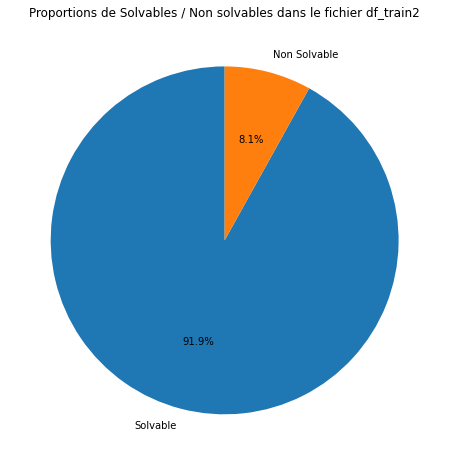

In [105]:
# Target
plt.figure(figsize = (8, 8))
# % de valeurs 'TARGET' différentes
x = df_train2['TARGET'].value_counts()/len(df_train2)*100
# Pieplot 
plt.pie(x,
        autopct='%1.1f%%',
        labels=["Solvable", "Non Solvable"],
        startangle=90)
plt.title("Proportions de Solvables / Non solvables dans le fichier df_train2")
plt.show()

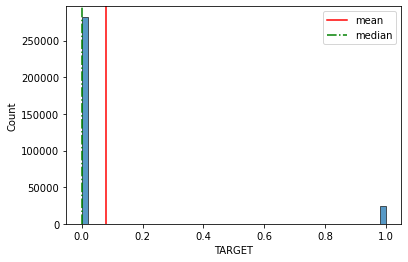

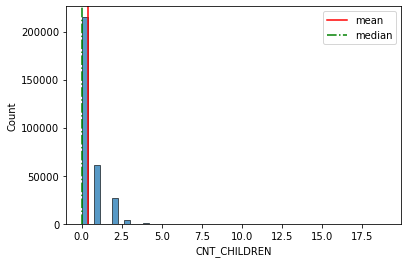

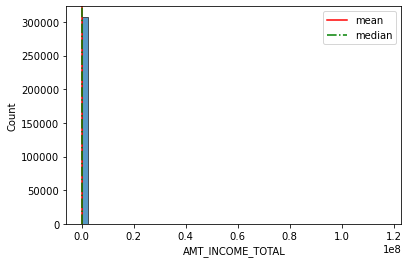

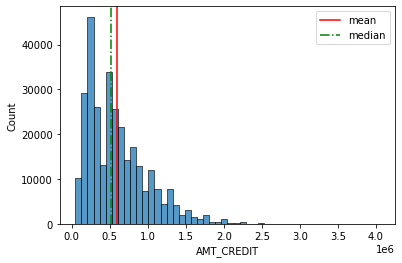

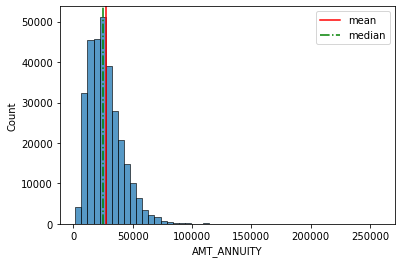

...

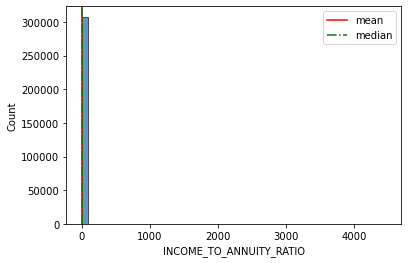

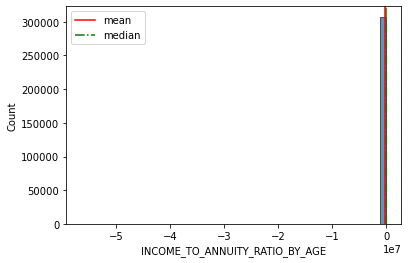

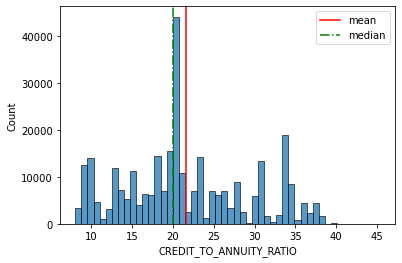

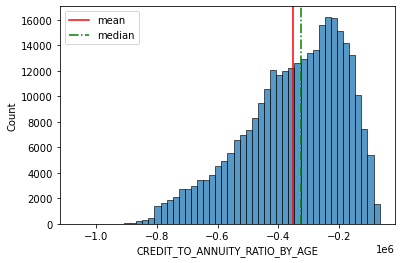

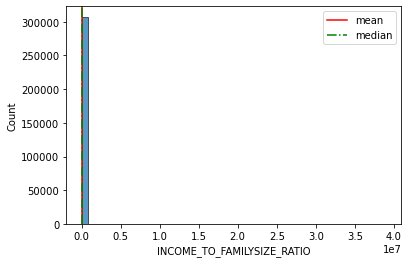

In [106]:
# Distribution histogrammes
for col in df_train2.columns:
    if df_train2[col].dtypes != object:
        if df_train2[col].dtype != bool:
            sns.histplot(df_train2[col], kde = False, bins=50)
            mean = df_train2[col].mean()
            median = df_train2[col].median()
            plt.axvline(mean,  color='red', ls='-', lw=1.5)
            plt.axvline(median, color='green', ls='-.', lw=1.5)
            plt.autoscale()
            plt.legend(['mean', 'median'])
            plt.show()

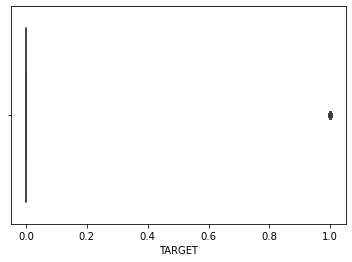

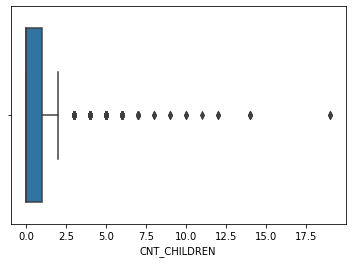

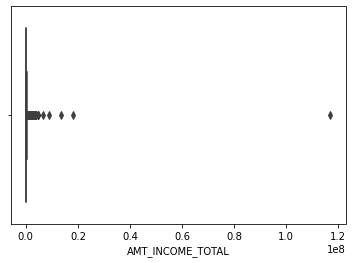

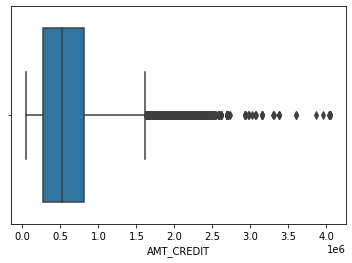

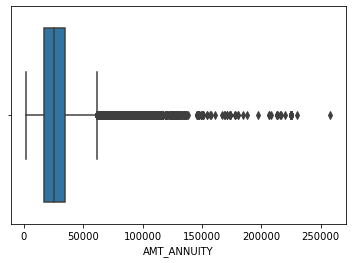

...

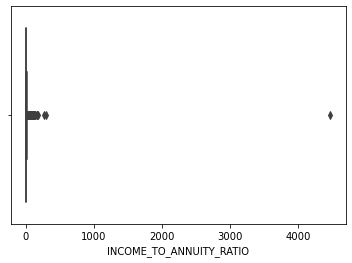

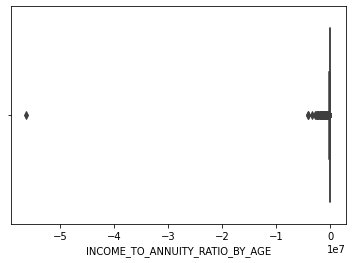

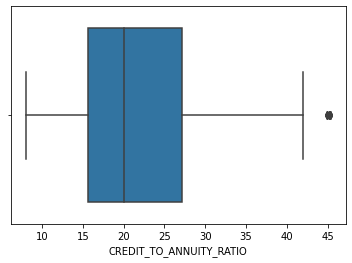

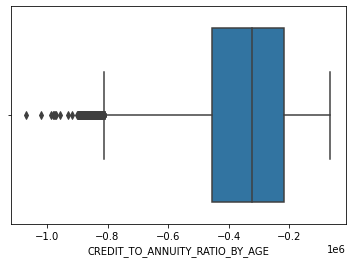

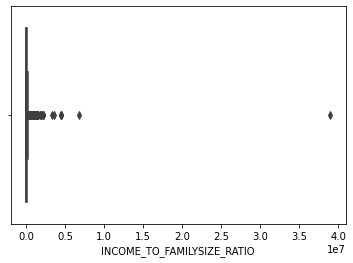

In [107]:
# Boxplots
for col in df_train2.columns:
    if df_train2[col].dtype != object:
        if df_train2[col].dtype != bool:
            sns.boxplot(x = df_train2[col])
            plt.show()

In [108]:
# Valeurs manquantes
NaN_train = pd.DataFrame()
NaN_train['col'] = df_train2.columns
for col in df_train2.columns:
    print(col)
    null = df_train2[col].isnull().sum()
    nullP = 100*null/df_train2.shape[0]
    print('NaN : {}, soit {} %'.format(null, nullP))
    NaN_train.loc[NaN_train['col'] == col, 'Pct'] = nullP

TARGET
NaN : 0, soit 0.0 %
NAME_CONTRACT_TYPE
NaN : 0, soit 0.0 %
CODE_GENDER
NaN : 0, soit 0.0 %
FLAG_OWN_CAR
NaN : 0, soit 0.0 %
FLAG_OWN_REALTY
NaN : 0, soit 0.0 %
CNT_CHILDREN
NaN : 0, soit 0.0 %
AMT_INCOME_TOTAL
NaN : 0, soit 0.0 %
AMT_CREDIT
NaN : 0, soit 0.0 %
AMT_ANNUITY
NaN : 12, soit 0.00390235019040217 %
AMT_GOODS_PRICE
NaN : 278, soit 0.09040444607765026 %
NAME_TYPE_SUITE
NaN : 1292, soit 0.4201530371666336 %
NAME_INCOME_TYPE
NaN : 0, soit 0.0 %
NAME_EDUCATION_TYPE
NaN : 0, soit 0.0 %
NAME_FAMILY_STATUS
NaN : 0, soit 0.0 %
NAME_HOUSING_TYPE
NaN : 0, soit 0.0 %
REGION_POPULATION_RELATIVE
NaN : 0, soit 0.0 %
DAYS_BIRTH
NaN : 0, soit 0.0 %
DAYS_EMPLOYED
NaN : 55374, soit 18.007394953610813 %
DAYS_REGISTRATION
NaN : 0, soit 0.0 %
DAYS_ID_PUBLISH
NaN : 0, soit 0.0 %
FLAG_MOBIL
NaN : 0, soit 0.0 %
FLAG_EMP_PHONE
NaN : 0, soit 0.0 %
FLAG_WORK_PHONE
NaN : 0, soit 0.0 %
FLAG_CONT_MOBILE
NaN : 0, soit 0.0 %
FLAG_PHONE
NaN : 0, soit 0.0 %
FLAG_EMAIL
NaN : 0, soit 0.0 %
OCCUPATION_TYPE

In [109]:
NaN_train.sort_values('Pct', ascending=False, inplace=True)

In [110]:
NaN_train

,col,Pct
26,OCCUPATION_TYPE,31.345303
92,MEAN(bureau.DAYS_ENDDATE_FACT),25.090811
82,MAX(bureau.DAYS_ENDDATE_FACT),25.090811
102,MIN(bureau.DAYS_ENDDATE_FACT),25.090811
75,MAX(bureau.AMT_CREDIT_SUM_LIMIT),21.160169
95,MIN(bureau.AMT_CREDIT_SUM_LIMIT),21.160169
85,MEAN(bureau.AMT_CREDIT_SUM_LIMIT),21.160169
40,EXT_SOURCE_3,19.825565
187,PROPORTION_LIFE_EMPLOYED,18.007395
17,DAYS_EMPLOYED,18.007395


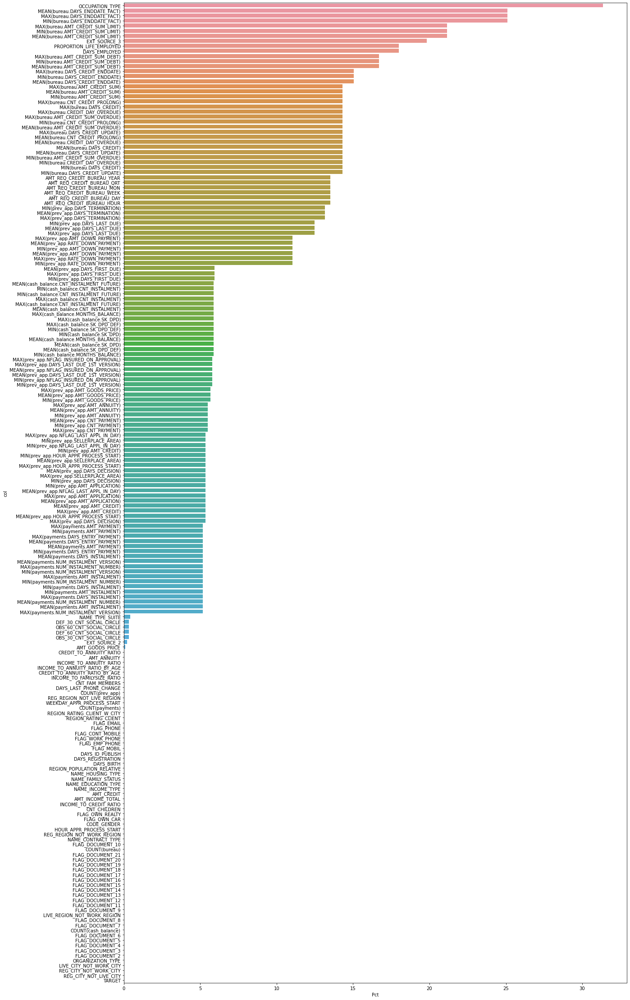

In [111]:
fig = plt.figure(figsize=(20,40))
sns.barplot(x="Pct", y="col", data=NaN_train)
plt.show()

## 2. df_app, jeu non étiqueté

In [112]:
df_app2.shape

(48744, 193)

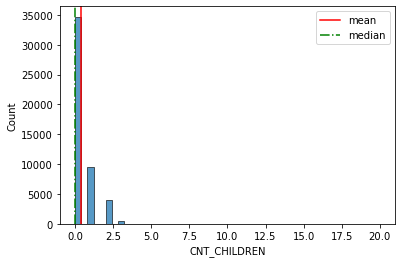

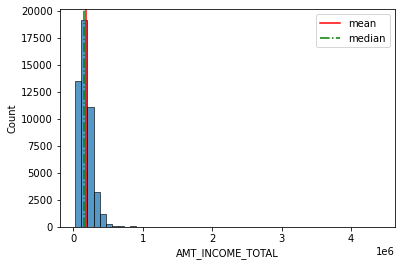

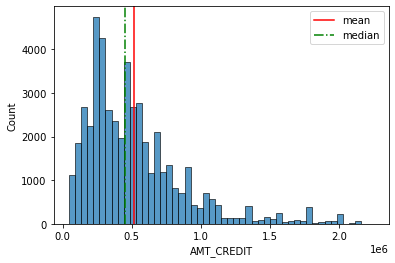

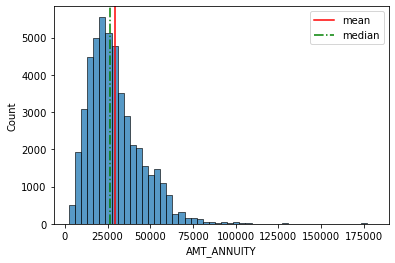

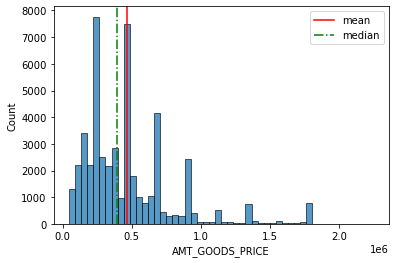

...

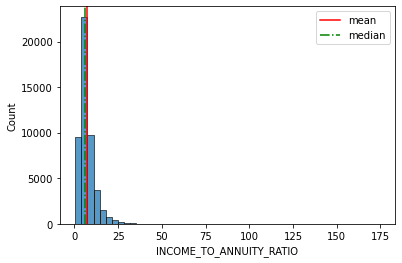

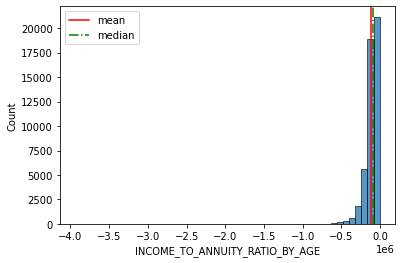

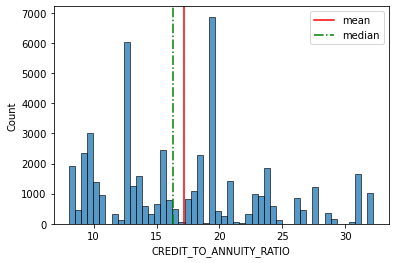

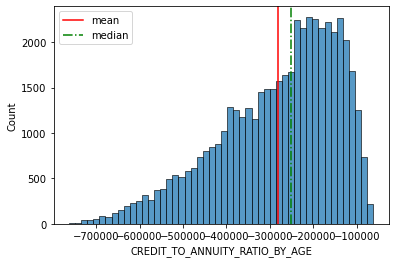

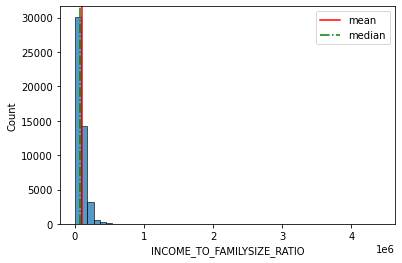

In [114]:
for col in df_app2.columns:
    if df_app2[col].dtypes != object:
        if df_app2[col].dtype != bool:
            sns.histplot(df_app2[col], kde = False, bins=50)
            mean = df_app2[col].mean()
            median = df_app2[col].median()
            plt.axvline(mean,  color='red', ls='-', lw=1.5)
            plt.axvline(median, color='green', ls='-.', lw=1.5)
            plt.autoscale()
            plt.legend(['mean', 'median'])
            plt.show()

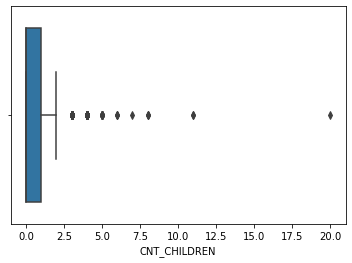

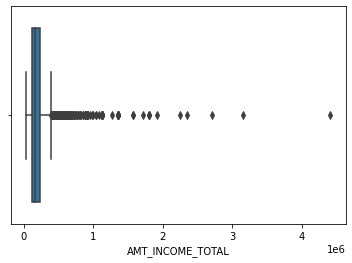

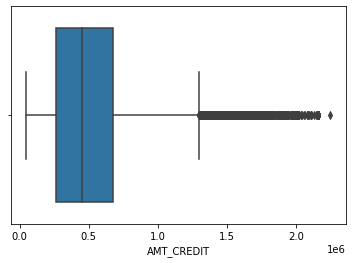

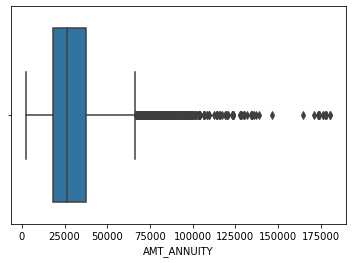

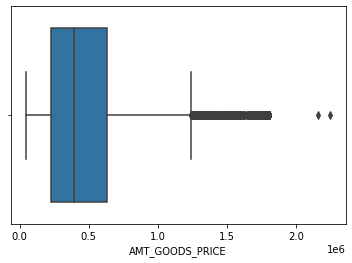

...

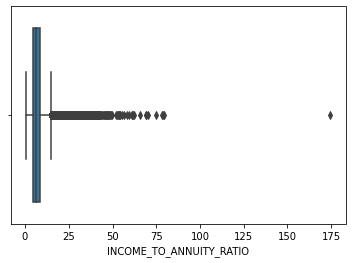

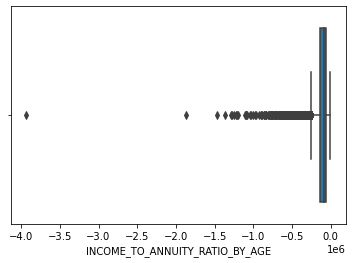

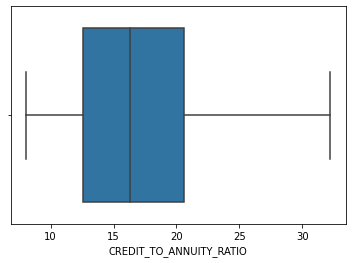

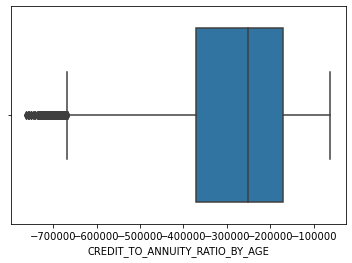

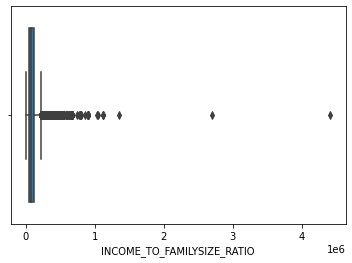

In [115]:
for col in df_app2.columns:
    if df_app2[col].dtype != object:
        if df_app2[col].dtype != bool:
            sns.boxplot(x = df_app2[col])
            plt.show()

In [116]:
NaN_app = pd.DataFrame()
NaN_app['col'] = df_app2.columns
for col in df_app2.columns:
    print(col)
    null = df_app2[col].isnull().sum()
    nullP = 100*null/df_app2.shape[0]
    print('NaN : {}, soit {} %'.format(null, nullP))
    NaN_app.loc[NaN_app['col'] == col, 'Pct'] = nullP

NAME_CONTRACT_TYPE
NaN : 0, soit 0.0 %
CODE_GENDER
NaN : 0, soit 0.0 %
FLAG_OWN_CAR
NaN : 0, soit 0.0 %
FLAG_OWN_REALTY
NaN : 0, soit 0.0 %
CNT_CHILDREN
NaN : 0, soit 0.0 %
AMT_INCOME_TOTAL
NaN : 0, soit 0.0 %
AMT_CREDIT
NaN : 0, soit 0.0 %
AMT_ANNUITY
NaN : 24, soit 0.049236829148202856 %
AMT_GOODS_PRICE
NaN : 0, soit 0.0 %
NAME_TYPE_SUITE
NaN : 911, soit 1.8689479730838667 %
NAME_INCOME_TYPE
NaN : 0, soit 0.0 %
NAME_EDUCATION_TYPE
NaN : 0, soit 0.0 %
NAME_FAMILY_STATUS
NaN : 0, soit 0.0 %
NAME_HOUSING_TYPE
NaN : 0, soit 0.0 %
REGION_POPULATION_RELATIVE
NaN : 0, soit 0.0 %
DAYS_BIRTH
NaN : 0, soit 0.0 %
DAYS_EMPLOYED
NaN : 9274, soit 19.02593139668472 %
DAYS_REGISTRATION
NaN : 0, soit 0.0 %
DAYS_ID_PUBLISH
NaN : 0, soit 0.0 %
FLAG_MOBIL
NaN : 0, soit 0.0 %
FLAG_EMP_PHONE
NaN : 0, soit 0.0 %
FLAG_WORK_PHONE
NaN : 0, soit 0.0 %
FLAG_CONT_MOBILE
NaN : 0, soit 0.0 %
FLAG_PHONE
NaN : 0, soit 0.0 %
FLAG_EMAIL
NaN : 0, soit 0.0 %
OCCUPATION_TYPE
NaN : 15605, soit 32.014196619071065 %
CNT_FAM

In [117]:
NaN_app.sort_values('Pct', ascending=False, inplace=True)

In [118]:
NaN_app

,col,Pct
25,OCCUPATION_TYPE,32.014197
91,MEAN(bureau.DAYS_ENDDATE_FACT),22.451994
81,MAX(bureau.DAYS_ENDDATE_FACT),22.451994
101,MIN(bureau.DAYS_ENDDATE_FACT),22.451994
74,MAX(bureau.AMT_CREDIT_SUM_LIMIT),21.916544
94,MIN(bureau.AMT_CREDIT_SUM_LIMIT),21.916544
84,MEAN(bureau.AMT_CREDIT_SUM_LIMIT),21.916544
186,PROPORTION_LIFE_EMPLOYED,19.025931
16,DAYS_EMPLOYED,19.025931
39,EXT_SOURCE_3,17.782701


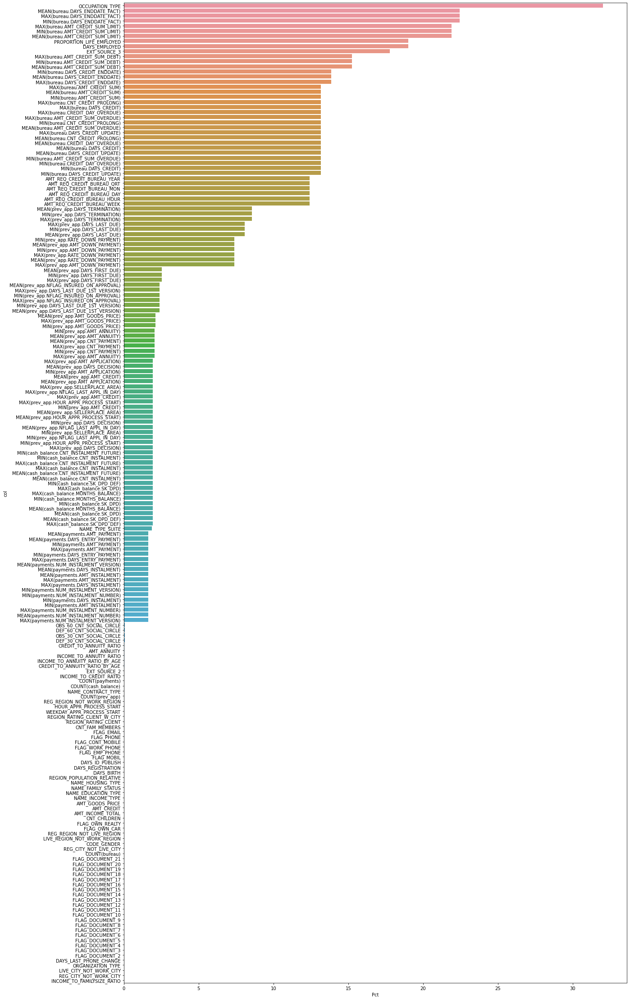

In [119]:
fig = plt.figure(figsize=(20,40))
sns.barplot(x="Pct", y="col", data=NaN_app)
plt.show()

# IV. Modèle de scoring

In [120]:
from sklearn.model_selection import train_test_split
# On split le jeu train en jeu d'entrainement (entrainement et Cross-Validations) et de test (généralisation)
train_set, test_set = train_test_split(df_train2, test_size=0.2, random_state=42, stratify=df_train2["TARGET"])

## 1. Sélection d'un modèle de machine learning

Pour la première étape, nous allons réaliser une baseline et nous allons tester, en cross-validations, différents modèles de machine learning pour voir lequel parait le mieux adapté à notre projet.

In [121]:
var_cat = []
for col in df_train2.columns:
    if df_train2[col].dtypes == object:
        var_cat.append(col)

In [122]:
var_num = df_train2.columns
var_num = var_num.drop('TARGET')
var_num = var_num.drop(var_cat)

In [123]:
# preproc
from sklearn.preprocessing import StandardScaler
categorical_transformer = OneHotEncoder(handle_unknown="ignore")
imputer = SimpleImputer(strategy='median')

cat = Pipeline(steps=[("encoder", OneHotEncoder(handle_unknown="ignore")), ("imputer", SimpleImputer(strategy='median'))])
num = Pipeline(steps=[("imputer", SimpleImputer(strategy='median')), ("scaler", StandardScaler())])

preprocessor = ColumnTransformer(transformers=[
    ("cat_transform", cat, var_cat),
    ("num_tranform", imputer, var_num)
])

# pour régression logistique
preprocessor2 = ColumnTransformer(transformers=[
    ("cat_transform", cat, var_cat),
    ("num_tranform", num, var_num)
])

In [124]:
# pipeline avec différents modèles
baseline = Pipeline(steps=[("preprocesser", preprocessor), ("regressor", DummyClassifier())])
RF = Pipeline(steps=[("preprocesser", preprocessor), ("regressor", RandomForestClassifier(class_weight='balanced', random_state=42))])
lgbm = Pipeline(steps=[("preprocesser", preprocessor), ("regressor", LGBMClassifier(is_unbalance=True, random_state=42))]) 

In [125]:
regr_log = Pipeline(steps=[("preprocesser", preprocessor2), ("regressor", LogisticRegression(random_state=42))]) 

In [126]:
from sklearn.metrics import *

Pour l'octroi de prêt bancaire, nous souhaitons avant tout diminuer le nombre de faux négatifs (personnes non solvables à qui on attribue un prêt), tout en contrôlant le nombre de faux positifs (personnes à qui on attribue pas de prêt alors qu'elles sont solvables).
Pour évaluer ces différents aspects, nous pouvons calculer plusieurs indices tels que:
* le rappel (=recall) qui correspond à la formule : vrai positifs/(vrai positifs + faux négatifs)
* la précision qui correspond à la formule : vrai positifs/(vrai positifs + faux positifs)
* le score f2 qui est un score qui permet de prend en compte à la fois le rappel et la précision mais qui va donner plus de poids au rappel.
* le score 'balanced_accuracy' qui correspond à la formule : (rappel + spécificité)/2

Au vu de notre problématique, le meilleur modèle sera choisi en fonction du score f2 qui permet de pénaliser les faux négatifs tout en contrôlant en moindre mesure les faux positifs.

In [127]:
scores = dict(f2=make_scorer(fbeta_score, beta=2),
              recall=make_scorer(recall_score),
              precision=make_scorer(precision_score),
              balanced_accuracy=make_scorer(balanced_accuracy_score),
              f1=make_scorer(f1_score))

In [128]:
X = train_set.drop(columns="TARGET")
y = train_set["TARGET"]
cv = StratifiedKFold(n_splits=5)

In [129]:
# Cross validations
from sklearn.model_selection import cross_validate
scores_b = cross_validate(baseline, X, y, cv=cv, scoring=scores, return_estimator=True)
scores_rf = cross_validate(RF, X, y, cv=cv, scoring=scores, return_estimator=True)
scores_l = cross_validate(lgbm, X, y, cv=cv, scoring=scores, return_estimator=True)

/Users/charlottepostel/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/charlottepostel/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/charlottepostel/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/charlottepostel/opt/anaconda3/lib/python3.8/s

In [130]:
scores_lr = cross_validate(regr_log, X, y, cv=cv, scoring=scores, return_estimator=True)

/Users/charlottepostel/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/charlottepostel/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/lin

In [131]:
# Plot graphes roc et precision-rappel
def plot_roc_pr_CV(scoresCV_estimator, X, y, cv):  
    aucs = []
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(15,5))

    for i, (train, test) in enumerate(cv.split(X, y)):
        viz = plot_roc_curve(scoresCV_estimator['estimator'][i], X.iloc[test], y.iloc[test], name='CV {}'.format(i+1),
                             alpha=0.8, lw=1, ax=ax1)
        aucs.append(viz.roc_auc)

    ax1.plot([0, 1], [0, 1], linestyle='--', lw=2, color='b',
            label='Chance', alpha=.5)

    mean_auc = np.mean(aucs)
    st_auc = np.std(aucs)

    ax1.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05],
           title="Courbe ROC (moyenne AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, st_auc))
    ax1.legend(loc="lower right")
    
    aucs2 = []
    for i, (train, test) in enumerate(cv.split(X, y)):
        viz2 = plot_precision_recall_curve(scoresCV_estimator['estimator'][i], X.iloc[test], y.iloc[test], name='CV {}'.format(i+1),
                             alpha=0.8, lw=1, ax=ax2)
        aucs2.append(viz2.average_precision)

    mean_auc2 = np.mean(aucs2)
    st_auc2 = np.std(aucs2)

    ax2.set(xlim=[-0.05, 1.02], ylim=[0, 1.02],
           title="Courbe précision-rappel (moyenne AUC = %0.2f $\pm$ %0.2f)" % (mean_auc2, st_auc2))
    ax2.legend(loc="upper right")
    plt.show()
    

Modèle Baseline


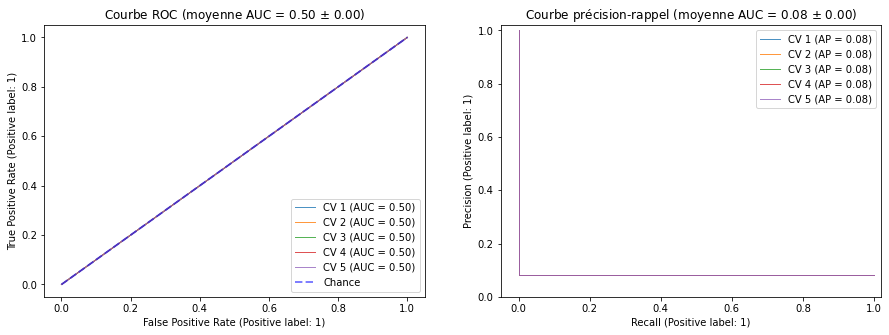


Modèle Regression logistique


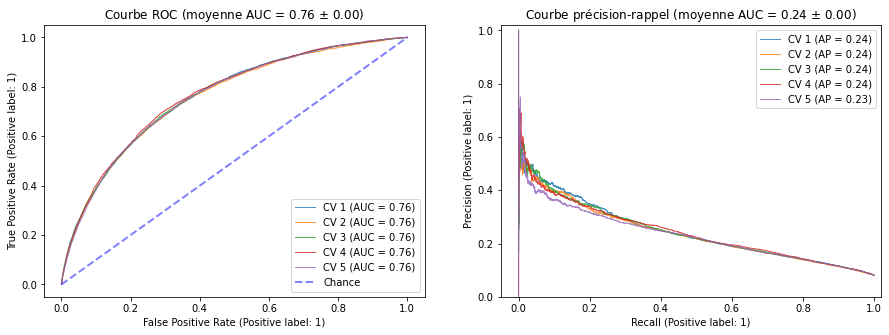


Modèle Random Forest


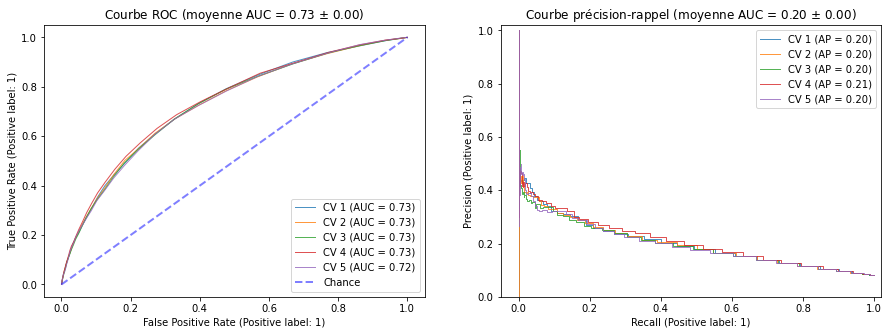


Modèle lightgbm


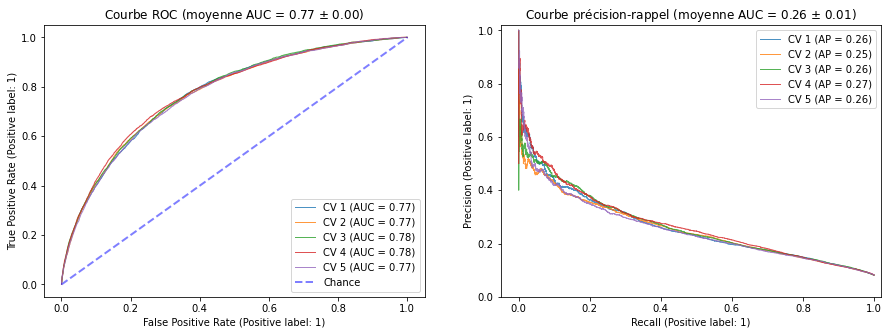

In [132]:
# Graphiques ROC et Précision - Rappel
for i, j in [['Baseline', scores_b], ['Regression logistique', scores_lr], ['Random Forest', scores_rf], ['lightgbm', scores_l]]:
    print('Modèle', i)
    plot_roc_pr_CV(j, X, y, cv)
    print('')

In [133]:
# moyenner les metrics des CV
def table_sc(df_sc, model):
    df_sc = pd.DataFrame(df_sc).drop(columns='estimator')
    df_sc['model'] = model
    df_sc = df_sc.groupby('model').agg(['mean', 'std'])
    df_scores = df_sc.copy()
    return df_scores

In [134]:
df_sc_b = table_sc(scores_b, 'baseline')
df_sc_lr = table_sc(scores_lr, 'regression log')
df_sc_rf = table_sc(scores_rf, 'RF')
df_sc_l = table_sc(scores_l, 'lgbm')
scoresCV = pd.concat([df_sc_b, df_sc_lr, df_sc_rf, df_sc_l])

In [135]:
# table récapitulant les résultats des cross validations selon les modèles
scoresCV

fit_time           score_time             test_f2            \
                      mean       std       mean       std      mean       std   
model                                                                           
baseline          8.088713  0.548793   0.589386  0.100108  0.000000  0.000000   
regression log   15.405445  0.252548   0.644281  0.022410  0.025783  0.001655   
RF              150.928744  3.258349   2.448992  0.188732  0.001069  0.000358   
lgbm             18.673713  1.120946   0.960419  0.039325  0.436874  0.004697   

               test_recall           test_precision            \
                      mean       std           mean       std   
model                                                           
baseline          0.000000  0.000000       0.000000  0.000000   
regression log    0.020846  0.001349       0.490760  0.020381   
RF                0.000856  0.000287       0.374762  0.083186   
lgbm              0.685498  0.010201       0.178266  0.001200   

               test_balanced_accuracy             test_f1            
                                 mean       std      mean       std  
model                                                                
baseline                     0.500000  0.000000  0.000000  0.000000  
regression log               0.509472  0.000650  0.039989  0.002511  
RF                           0.500357  0.000111  0.001707  0.000571  
lgbm                         0.704006  0.004131  0.282947  0.002348

Le modèle ayant le score f2 le plus élevé est le modèle lgbm.

In [140]:
# plot score F2 en fonction du seuil
def plot_f2_seuil(scores_estimator, X, y, cv):    
    seuil = []
    pr = []
    rec = []
    f2 = []
    y_real = []
    y_proba = []

    for i, (train, test) in enumerate(cv.split(X, y)):
        pred = scores_estimator['estimator'][i].predict_proba(X.iloc[test])[:,1]
        tb = pd.DataFrame(precision_recall_curve(y.iloc[test], pred))
        tb = tb.transpose()
        tb.columns = ['precision', 'recall', 'seuil']
        tb = round(tb, 3)
        tb['F2'] = ((1 + 2**2) * tb['precision'] * tb['recall']) / (2**2 * tb['precision'] + tb['recall'])
        plt.plot(tb['seuil'], tb['F2'], alpha=0.4, label='CV {}'.format(i+1))
        
        maxf2_seuil = tb['seuil'].iloc[tb['F2'].argmax()]
        pr_seuil = tb['precision'].iloc[tb['F2'].argmax()]
        rec_seuil = tb['recall'].iloc[tb['F2'].argmax()]
        max_f2 = tb['F2'].iloc[tb['F2'].argmax()]

        seuil.append(maxf2_seuil)
        pr.append(pr_seuil)
        rec.append(rec_seuil)
        f2.append(max_f2)
        
        y_real.append(y.iloc[test])
        y_proba.append(pred)

    y_real = np.concatenate(y_real)
    y_proba = np.concatenate(y_proba)
    tb2 = pd.DataFrame(precision_recall_curve(y_real, y_proba)).transpose()
    tb2.columns = ['precision', 'recall', 'seuil']
    #tb2 = round(tb2, 3)
    tb2['F2'] = ((1 + 2**2) * tb2['precision'] * tb2['recall']) / (2**2 * tb2['precision'] + tb2['recall'])
    plt.plot(tb2['seuil'], tb2['F2'], color='b', label='All CVs')
    
    maxf2_seuil = tb2['seuil'].iloc[tb2['F2'].argmax()]
    pr_seuil = tb2['precision'].iloc[tb2['F2'].argmax()]
    rec_seuil = tb2['recall'].iloc[tb2['F2'].argmax()]
    max_f2 = tb2['F2'].iloc[tb2['F2'].argmax()]

    seuil.append(maxf2_seuil)
    pr.append(pr_seuil)
    rec.append(rec_seuil)
    f2.append(max_f2)


    table_seuil = pd.DataFrame(index=['cv1', 'cv2', 'cv3', 'cv4', 'cv5', 'allCV'])
    table_seuil['f2_max'] = f2
    table_seuil['precision'] = pr
    table_seuil['recall'] = rec
    table_seuil['seuil'] = seuil
    

    plt.axvline(seuil[-1],  color='b', ls='--', alpha=0.5)
    plt.xlabel('Seuil')
    plt.ylabel('f2-score')
    plt.legend(loc="lower left")
    plt.xticks(np.linspace(0.1, 1, 10))
    return plt.show(), table_seuil

Le seuil permettant de prédire les classes est par défaut 0,50.
Il est possible d'optimiser le modèle en choisissant le seuil qui correspond au meilleur score F2.

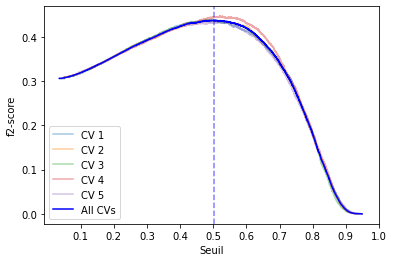

In [141]:
plot, table_seuil = plot_f2_seuil(scores_l, X, y, cv)

In [142]:
# valeurs correspondant au score F2 maximal par CV
table_seuil

,f2_max,precision,recall,seuil
cv1,0.437974,0.172000,0.714000,0.479000
cv2,0.437187,0.175000,0.699000,0.489000
cv3,0.439036,0.177000,0.697000,0.492000
cv4,0.446452,0.189000,0.677000,0.520000
cv5,0.433652,0.187000,0.647000,0.522000
allCV,0.437069,0.178957,0.683535,0.501701


Ici, le score F2 maximal est retrouvé si on considère le seuil à 0,50.

## 2. Optimisation des paramètres

Maintenant que nous avons choisi un modèle, il est possible de l'optimiser grâce à l'outil grid_search qui permet de tester différentes combinaisons de paramètres.

De plus, pour faire face au déséquilibres des classes, il est possible de pénaliser le modèle grâce au paramètre 'is_unbalance=True' ou d'utiliser des techniques d'échantillonnage. 

Ainsi, dans une première partie, nous essayerons d'optimiser le modèle en prenant en compte 'unbalanced=True' et dans une deuxième partie nous essayerons d'optimiser le modèle avec des techniques d'échantillonnage.

### a. Grid_search avec paramètre is_unbalance=True

In [143]:
param_grid2 = {"regressor__n_estimators": [100, 500],
                #"regressor__max_depth": [-1, 20], après test de diff valeurs, toujours best à -1
                "regressor__learning_rate": [0.05, 0.1, 0.2],
                "regressor__num_leaves": [20, 31],
                "regressor__colsample_bytree": [0.8, 0.9, 1]}

In [144]:
f2_scorer = make_scorer(fbeta_score, beta=2)

In [145]:
grid_search = GridSearchCV(lgbm, param_grid2, scoring=f2_scorer, cv=cv, n_jobs=1, verbose=10)
grid_search.fit(train_set.drop(columns="TARGET"), train_set['TARGET'])

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV 1/5; 1/36] START regressor__colsample_bytree=0.8, regressor__learning_rate=0.05, regressor__n_estimators=100, regressor__num_leaves=20
[CV 1/5; 1/36] END regressor__colsample_bytree=0.8, regressor__learning_rate=0.05, regressor__n_estimators=100, regressor__num_leaves=20; total time=  24.2s
[CV 2/5; 1/36] START regressor__colsample_bytree=0.8, regressor__learning_rate=0.05, regressor__n_estimators=100, regressor__num_leaves=20
[CV 2/5; 1/36] END regressor__colsample_bytree=0.8, regressor__learning_rate=0.05, regressor__n_estimators=100, regressor__num_leaves=20; total time=  22.3s
[CV 3/5; 1/36] START regressor__colsample_bytree=0.8, regressor__learning_rate=0.05, regressor__n_estimators=100, regressor__num_leaves=20
[CV 3/5; 1/36] END regressor__colsample_bytree=0.8, regressor__learning_rate=0.05, regressor__n_estimators=100, regressor__num_leaves=20; total time=  22.8s
[CV 4/5; 1/36] START regressor__colsample_bytree=0

[CV 4/5; 6/36] END regressor__colsample_bytree=0.8, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=31; total time=  17.3s
[CV 5/5; 6/36] START regressor__colsample_bytree=0.8, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=31
[CV 5/5; 6/36] END regressor__colsample_bytree=0.8, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=31; total time=  17.5s
[CV 1/5; 7/36] START regressor__colsample_bytree=0.8, regressor__learning_rate=0.1, regressor__n_estimators=500, regressor__num_leaves=20
[CV 1/5; 7/36] END regressor__colsample_bytree=0.8, regressor__learning_rate=0.1, regressor__n_estimators=500, regressor__num_leaves=20; total time=  27.7s
[CV 2/5; 7/36] START regressor__colsample_bytree=0.8, regressor__learning_rate=0.1, regressor__n_estimators=500, regressor__num_leaves=20
[CV 2/5; 7/36] END regressor__colsample_bytree=0.8, regressor__learning_rate=0.1, regressor__n_estimators=500, regress

[CV 2/5; 12/36] END regressor__colsample_bytree=0.8, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=31; total time=  29.4s
[CV 3/5; 12/36] START regressor__colsample_bytree=0.8, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=31
[CV 3/5; 12/36] END regressor__colsample_bytree=0.8, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=31; total time=  29.8s
[CV 4/5; 12/36] START regressor__colsample_bytree=0.8, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=31
[CV 4/5; 12/36] END regressor__colsample_bytree=0.8, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=31; total time=  29.0s
[CV 5/5; 12/36] START regressor__colsample_bytree=0.8, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=31
[CV 5/5; 12/36] END regressor__colsample_bytree=0.8, regressor__learning_rate=0.2, regressor__n_estimators=500, 

[CV 5/5; 17/36] END regressor__colsample_bytree=0.9, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=20; total time=  16.7s
[CV 1/5; 18/36] START regressor__colsample_bytree=0.9, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=31
[CV 1/5; 18/36] END regressor__colsample_bytree=0.9, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=31; total time=  17.9s
[CV 2/5; 18/36] START regressor__colsample_bytree=0.9, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=31
[CV 2/5; 18/36] END regressor__colsample_bytree=0.9, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=31; total time=  18.0s
[CV 3/5; 18/36] START regressor__colsample_bytree=0.9, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=31
[CV 3/5; 18/36] END regressor__colsample_bytree=0.9, regressor__learning_rate=0.1, regressor__n_estimators=100, 

[CV 3/5; 23/36] END regressor__colsample_bytree=0.9, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=20; total time=  30.4s
[CV 4/5; 23/36] START regressor__colsample_bytree=0.9, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=20
[CV 4/5; 23/36] END regressor__colsample_bytree=0.9, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=20; total time=  29.0s
[CV 5/5; 23/36] START regressor__colsample_bytree=0.9, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=20
[CV 5/5; 23/36] END regressor__colsample_bytree=0.9, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=20; total time=  28.6s
[CV 1/5; 24/36] START regressor__colsample_bytree=0.9, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=31
[CV 1/5; 24/36] END regressor__colsample_bytree=0.9, regressor__learning_rate=0.2, regressor__n_estimators=500, 

[CV 1/5; 29/36] END regressor__colsample_bytree=1, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=20; total time=  17.3s
[CV 2/5; 29/36] START regressor__colsample_bytree=1, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=20
[CV 2/5; 29/36] END regressor__colsample_bytree=1, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=20; total time=  17.5s
[CV 3/5; 29/36] START regressor__colsample_bytree=1, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=20
[CV 3/5; 29/36] END regressor__colsample_bytree=1, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=20; total time=  17.2s
[CV 4/5; 29/36] START regressor__colsample_bytree=1, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=20
[CV 4/5; 29/36] END regressor__colsample_bytree=1, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num

[CV 5/5; 34/36] END regressor__colsample_bytree=1, regressor__learning_rate=0.2, regressor__n_estimators=100, regressor__num_leaves=31; total time=  17.4s
[CV 1/5; 35/36] START regressor__colsample_bytree=1, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=20
[CV 1/5; 35/36] END regressor__colsample_bytree=1, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=20; total time=  30.4s
[CV 2/5; 35/36] START regressor__colsample_bytree=1, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=20
[CV 2/5; 35/36] END regressor__colsample_bytree=1, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=20; total time=  30.0s
[CV 3/5; 35/36] START regressor__colsample_bytree=1, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=20
[CV 3/5; 35/36] END regressor__colsample_bytree=1, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=Pipeline(steps=[('preprocesser',
                                        ColumnTransformer(transformers=[('cat_transform',
                                                                         Pipeline(steps=[('encoder',
                                                                                          OneHotEncoder(handle_unknown='ignore')),
                                                                                         ('imputer',
                                                                                          SimpleImputer(strategy='median'))]),
                                                                         ['NAME_CONTRACT_TYPE',
                                                                          'CODE_GENDER',
                                                                          'FLAG_OWN_CAR',
                                        

In [146]:
grid_search.best_params_

{'regressor__colsample_bytree': 0.9,
 'regressor__learning_rate': 0.05,
 'regressor__n_estimators': 500,
 'regressor__num_leaves': 20}

In [147]:
grid_search.best_score_

0.4406106762244498

In [148]:
lgbmB = Pipeline(steps=[("preprocesser", preprocessor),
                        ("regressor", LGBMClassifier(is_unbalance=True, random_state=42,
                                                     n_estimators=500, learning_rate=0.05,
                                                     num_leaves=20, colsample_bytree=0.9))]) 

In [149]:
# autres scores
scores_lgbmB = cross_validate(lgbmB, X, y, cv=cv, scoring=scores, return_estimator=True)

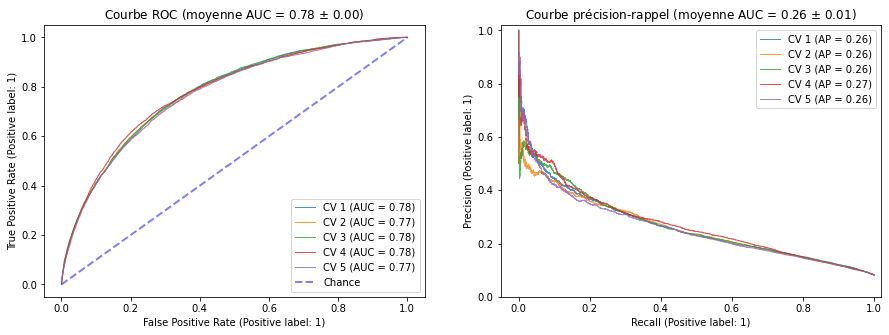

In [150]:
plot_roc_pr_CV(scores_lgbmB, X, y, cv)

In [151]:
# table scores
table_sc(scores_lgbmB, 'lgbm Best')

fit_time            score_time             test_f2            \
                 mean        std       mean       std      mean       std   
model                                                                       
lgbm Best  179.048644  329.23328    1.35475  0.022932  0.440611  0.005513   

          test_recall           test_precision            \
                 mean       std           mean       std   
model                                                      
lgbm Best    0.673766  0.011162       0.184811  0.001516   

          test_balanced_accuracy             test_f1            
                            mean       std      mean       std  
model                                                           
lgbm Best               0.706394  0.004718  0.290057  0.002885

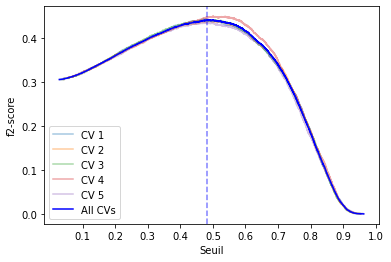

In [152]:
# il est aussi possible d'optimiser le seuil 
plot, table_seuilB = plot_f2_seuil(scores_lgbmB, X, y, cv)

In [153]:
table_seuilB

,f2_max,precision,recall,seuil
cv1,0.443400,0.179000,0.703000,0.480000
cv2,0.439823,0.182000,0.681000,0.492000
cv3,0.441483,0.179000,0.697000,0.481000
cv4,0.449792,0.188000,0.690000,0.501000
cv5,0.435839,0.177000,0.687000,0.481000
allCV,0.440772,0.177963,0.698741,0.480518


Le modèle semble réaliser de meilleures performances (score F2) lorsqu'on choisit un seuil à 0,48.

### b. Techniques de sur- et sous-échantillonnage

Peut-on obtenir de meilleurs résultats avec des techniques d'échantillonnage à la place de mettre le paramètre is_unbalance=True, pour faire face au déséquilibre des classes ?

In [154]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as imPipe

In [155]:
oversampled = SMOTE(random_state=42)
undersampled = RandomUnderSampler(random_state=42)

lgbm_ech = imPipe([('preprocesser', preprocessor),
                   ('ech', undersampled),
                   ('regressor', LGBMClassifier(is_unbalance=False, random_state=42,
                                                n_estimators=500, learning_rate=0.05,
                                                num_leaves=20, colsample_bytree=0.9))])

In [156]:
param_gridE = {"ech":[oversampled, undersampled]}

In [157]:
grid_searchE = GridSearchCV(lgbm_ech, param_gridE, scoring=f2_scorer, cv=cv, n_jobs=1, verbose=10)
grid_searchE.fit(train_set.drop(columns="TARGET"), train_set['TARGET'])

Fitting 5 folds for each of 2 candidates, totalling 10 fits
[CV 1/5; 1/2] START ech=SMOTE(random_state=42)..................................
[CV 1/5; 1/2] END ................ech=SMOTE(random_state=42); total time= 1.2min
[CV 2/5; 1/2] START ech=SMOTE(random_state=42)..................................
[CV 2/5; 1/2] END ................ech=SMOTE(random_state=42); total time= 1.2min
[CV 3/5; 1/2] START ech=SMOTE(random_state=42)..................................
[CV 3/5; 1/2] END ................ech=SMOTE(random_state=42); total time= 1.2min
[CV 4/5; 1/2] START ech=SMOTE(random_state=42)..................................
[CV 4/5; 1/2] END ................ech=SMOTE(random_state=42); total time= 1.1min
[CV 5/5; 1/2] START ech=SMOTE(random_state=42)..................................
[CV 5/5; 1/2] END ................ech=SMOTE(random_state=42); total time= 1.4min
[CV 1/5; 2/2] START ech=RandomUnderSampler(random_state=42).....................
[CV 1/5; 2/2] END ...ech=RandomUnderSampler(rando

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=Pipeline(steps=[('preprocesser',
                                        ColumnTransformer(transformers=[('cat_transform',
                                                                         Pipeline(steps=[('encoder',
                                                                                          OneHotEncoder(handle_unknown='ignore')),
                                                                                         ('imputer',
                                                                                          SimpleImputer(strategy='median'))]),
                                                                         ['NAME_CONTRACT_TYPE',
                                                                          'CODE_GENDER',
                                                                          'FLAG_OWN_CAR',
                                        

In [158]:
grid_searchE.best_params_

{'ech': RandomUnderSampler(random_state=42)}

In [159]:
grid_searchE.best_score_

0.43674970601113816

In [160]:
grid_searchE.cv_results_

{'mean_fit_time': array([71.53642297, 14.04987164]),
 'std_fit_time': array([5.15891273, 0.69976374]),
 'mean_score_time': array([1.48338599, 1.25622463]),
 'std_score_time': array([0.12971686, 0.01966712]),
 'param_ech': masked_array(data=[SMOTE(random_state=42),
                    RandomUnderSampler(random_state=42)],
              mask=[False, False],
        fill_value='?',
             dtype=object),
 'params': [{'ech': SMOTE(random_state=42)},
  {'ech': RandomUnderSampler(random_state=42)}],
 'split0_test_score': array([0.04037267, 0.43595751]),
 'split1_test_score': array([0.03226407, 0.43390309]),
 'split2_test_score': array([0.02863724, 0.4373885 ]),
 'split3_test_score': array([0.03758231, 0.44196927]),
 'split4_test_score': array([0.0341976 , 0.43453016]),
 'mean_test_score': array([0.03461078, 0.43674971]),
 'std_test_score': array([0.00408388, 0.00287434]),
 'rank_test_score': array([2, 1], dtype=int32)}

La technique random undersample semble présenter de meilleurs résultats que la technique SMOTE.

In [161]:
# Recherche des paramètres optimaux avec la technique d'undersampling
param_gridE2 = {"ech":[undersampled],
                "regressor__n_estimators": [100, 500],
                "regressor__learning_rate": [0.05, 0.1, 0.2],
                "regressor__num_leaves": [20, 31],
                "regressor__colsample_bytree": [0.8, 0.9, 1]}

In [162]:
grid_searchE2 = GridSearchCV(lgbm_ech, param_gridE2, scoring=f2_scorer, cv=cv, n_jobs=1, verbose=10)
grid_searchE2.fit(train_set.drop(columns="TARGET"), train_set['TARGET'])

Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV 1/5; 1/36] START ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.8, regressor__learning_rate=0.05, regressor__n_estimators=100, regressor__num_leaves=20
[CV 1/5; 1/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.8, regressor__learning_rate=0.05, regressor__n_estimators=100, regressor__num_leaves=20; total time=  10.9s
[CV 2/5; 1/36] START ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.8, regressor__learning_rate=0.05, regressor__n_estimators=100, regressor__num_leaves=20
[CV 2/5; 1/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.8, regressor__learning_rate=0.05, regressor__n_estimators=100, regressor__num_leaves=20; total time=  10.5s
[CV 3/5; 1/36] START ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.8, regressor__learning_rate=0.05, regressor__n_estimators=100, regressor__num_leaves=20
[C

[CV 3/5; 5/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.8, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=20; total time=  10.4s
[CV 4/5; 5/36] START ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.8, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=20
[CV 4/5; 5/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.8, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=20; total time=  10.5s
[CV 5/5; 5/36] START ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.8, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=20
[CV 5/5; 5/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.8, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=20; total time=  10.4s
[CV 1/5; 6/36] START ech=RandomUnderSampler(random_

[CV 5/5; 9/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.8, regressor__learning_rate=0.2, regressor__n_estimators=100, regressor__num_leaves=20; total time=   9.9s
[CV 1/5; 10/36] START ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.8, regressor__learning_rate=0.2, regressor__n_estimators=100, regressor__num_leaves=31
[CV 1/5; 10/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.8, regressor__learning_rate=0.2, regressor__n_estimators=100, regressor__num_leaves=31; total time=  10.2s
[CV 2/5; 10/36] START ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.8, regressor__learning_rate=0.2, regressor__n_estimators=100, regressor__num_leaves=31
[CV 2/5; 10/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.8, regressor__learning_rate=0.2, regressor__n_estimators=100, regressor__num_leaves=31; total time=  10.1s
[CV 3/5; 10/36] START ech=RandomUnderSampler(ra

[CV 2/5; 14/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.9, regressor__learning_rate=0.05, regressor__n_estimators=100, regressor__num_leaves=31; total time=  10.8s
[CV 3/5; 14/36] START ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.9, regressor__learning_rate=0.05, regressor__n_estimators=100, regressor__num_leaves=31
[CV 3/5; 14/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.9, regressor__learning_rate=0.05, regressor__n_estimators=100, regressor__num_leaves=31; total time=  10.7s
[CV 4/5; 14/36] START ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.9, regressor__learning_rate=0.05, regressor__n_estimators=100, regressor__num_leaves=31
[CV 4/5; 14/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.9, regressor__learning_rate=0.05, regressor__n_estimators=100, regressor__num_leaves=31; total time=  10.7s
[CV 5/5; 14/36] START ech=RandomUnderSamp

[CV 4/5; 18/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.9, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=31; total time=  11.1s
[CV 5/5; 18/36] START ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.9, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=31
[CV 5/5; 18/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.9, regressor__learning_rate=0.1, regressor__n_estimators=100, regressor__num_leaves=31; total time=  10.8s
[CV 1/5; 19/36] START ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.9, regressor__learning_rate=0.1, regressor__n_estimators=500, regressor__num_leaves=20
[CV 1/5; 19/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.9, regressor__learning_rate=0.1, regressor__n_estimators=500, regressor__num_leaves=20; total time=  13.7s
[CV 2/5; 19/36] START ech=RandomUnderSampler(r

[CV 1/5; 23/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.9, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=20; total time=  13.4s
[CV 2/5; 23/36] START ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.9, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=20
[CV 2/5; 23/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.9, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=20; total time=  13.5s
[CV 3/5; 23/36] START ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.9, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=20
[CV 3/5; 23/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=0.9, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=20; total time=  13.5s
[CV 4/5; 23/36] START ech=RandomUnderSampler(r

[CV 3/5; 27/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=1, regressor__learning_rate=0.05, regressor__n_estimators=500, regressor__num_leaves=20; total time=  14.6s
[CV 4/5; 27/36] START ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=1, regressor__learning_rate=0.05, regressor__n_estimators=500, regressor__num_leaves=20
[CV 4/5; 27/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=1, regressor__learning_rate=0.05, regressor__n_estimators=500, regressor__num_leaves=20; total time=  14.6s
[CV 5/5; 27/36] START ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=1, regressor__learning_rate=0.05, regressor__n_estimators=500, regressor__num_leaves=20
[CV 5/5; 27/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=1, regressor__learning_rate=0.05, regressor__n_estimators=500, regressor__num_leaves=20; total time=  14.5s
[CV 1/5; 28/36] START ech=RandomUnderSampler(random

[CV 5/5; 31/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=1, regressor__learning_rate=0.1, regressor__n_estimators=500, regressor__num_leaves=20; total time=  14.1s
[CV 1/5; 32/36] START ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=1, regressor__learning_rate=0.1, regressor__n_estimators=500, regressor__num_leaves=31
[CV 1/5; 32/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=1, regressor__learning_rate=0.1, regressor__n_estimators=500, regressor__num_leaves=31; total time=  15.6s
[CV 2/5; 32/36] START ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=1, regressor__learning_rate=0.1, regressor__n_estimators=500, regressor__num_leaves=31
[CV 2/5; 32/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=1, regressor__learning_rate=0.1, regressor__n_estimators=500, regressor__num_leaves=31; total time=  15.6s
[CV 3/5; 32/36] START ech=RandomUnderSampler(random_stat

[CV 2/5; 36/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=1, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=31; total time=  15.4s
[CV 3/5; 36/36] START ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=1, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=31
[CV 3/5; 36/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=1, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=31; total time=  15.3s
[CV 4/5; 36/36] START ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=1, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=31
[CV 4/5; 36/36] END ech=RandomUnderSampler(random_state=42), regressor__colsample_bytree=1, regressor__learning_rate=0.2, regressor__n_estimators=500, regressor__num_leaves=31; total time=  15.6s
[CV 5/5; 36/36] START ech=RandomUnderSampler(random_stat

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=Pipeline(steps=[('preprocesser',
                                        ColumnTransformer(transformers=[('cat_transform',
                                                                         Pipeline(steps=[('encoder',
                                                                                          OneHotEncoder(handle_unknown='ignore')),
                                                                                         ('imputer',
                                                                                          SimpleImputer(strategy='median'))]),
                                                                         ['NAME_CONTRACT_TYPE',
                                                                          'CODE_GENDER',
                                                                          'FLAG_OWN_CAR',
                                        

In [163]:
grid_searchE2.best_params_

{'ech': RandomUnderSampler(random_state=42),
 'regressor__colsample_bytree': 0.9,
 'regressor__learning_rate': 0.05,
 'regressor__n_estimators': 500,
 'regressor__num_leaves': 20}

In [164]:
grid_searchE2.best_score_

0.43674970601113816

In [165]:
# autres scores
scores_lgbmE = cross_validate(lgbm_ech, X, y, cv=cv, scoring=scores, return_estimator=True)

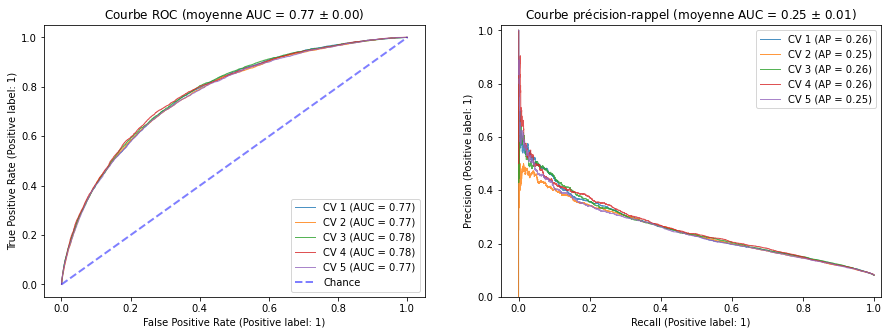

In [166]:
plot_roc_pr_CV(scores_lgbmE, X, y, cv)

In [167]:
# table scores
table_sc(scores_lgbmE, 'lgbm Best Ech')

fit_time           score_time            test_f2            \
                    mean       std       mean       std     mean       std   
model                                                                        
lgbm Best Ech  14.097633  2.215714   1.382436  0.020695  0.43675  0.003214   

              test_recall           test_precision            \
                     mean       std           mean       std   
model                                                          
lgbm Best Ech    0.703676  0.008758       0.173505  0.000513   

              test_balanced_accuracy             test_f1            
                                mean       std      mean       std  
model                                                               
lgbm Best Ech               0.704656  0.002973  0.278368  0.001261

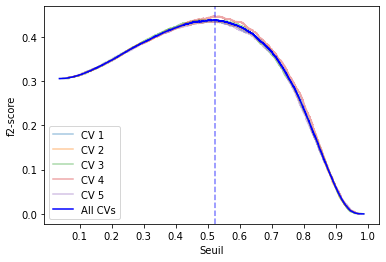

In [168]:
plot, tb_seuilE = plot_f2_seuil(scores_lgbmE, X, y, cv)

In [169]:
tb_seuilE

,f2_max,precision,recall,seuil
cv1,0.437500,0.175000,0.700000,0.504000
cv2,0.435021,0.190000,0.642000,0.545000
cv3,0.438627,0.183000,0.674000,0.523000
cv4,0.446078,0.182000,0.700000,0.518000
cv5,0.435248,0.172000,0.705000,0.494000
allCV,0.437424,0.181092,0.676989,0.521769


Ce modèle semble présenter de meilleures performances avec un seuil à 0,52. Néanmoins, le score f2 reste quand même inférieur au score f2 réalisé par le modèle précédant avec le paramètre 'unbalance=True'.

## 3. Meilleur modèle

Le modèle présentant le meilleur score F2 lors des crossValidations est le modèle lgbm sans échantillonnage (paramètre unbalance=True) qui prend en compte les paramètres optimaux trouvés avec grid_search.

In [170]:
best_model=grid_search.best_estimator_

In [171]:
# Importances des variables
# Nombre de fois la variable a été utilisé lors d'un split   
name_features = best_model[0].transformers_[0][1][0].get_feature_names(var_cat)
for i in var_num.values:
    name_features = np.append(name_features, i)
lg_imp = pd.DataFrame({'feature' : name_features,'importance' : best_model.steps[1][1].feature_importances_})
lg_imp.sort_values(by='importance',ascending=False, inplace=True)
lg_imp

,feature,importance
302,CREDIT_TO_ANNUITY_RATIO,406
151,EXT_SOURCE_3,275
150,EXT_SOURCE_2,268
130,DAYS_BIRTH,200
293,MIN(payments.AMT_PAYMENT),186
127,AMT_ANNUITY,166
191,MAX(bureau.DAYS_CREDIT_ENDDATE),162
133,DAYS_ID_PUBLISH,160
190,MAX(bureau.DAYS_CREDIT),139
126,AMT_CREDIT,125


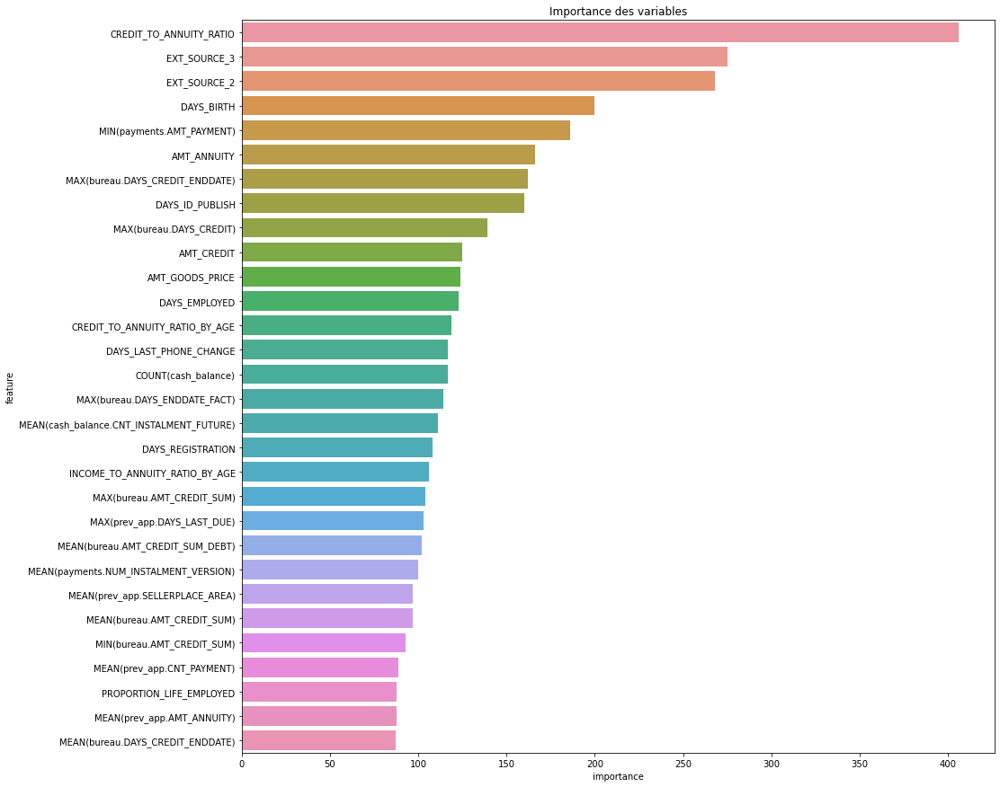

In [172]:
fig = plt.figure(figsize=(15,15))
lg_imp2 = lg_imp.iloc[:30]
sns.barplot(y = lg_imp2['feature'], x=lg_imp2['importance'])
plt.title('Importance des variables')
plt.show()

# V. Application du meilleur modèle sur un nouveau jeu de données étiquetées (test_set)

Cette étape permet de voir si le modèle est généralisable à un nouveau jeu de données.

## 1. Evaluation

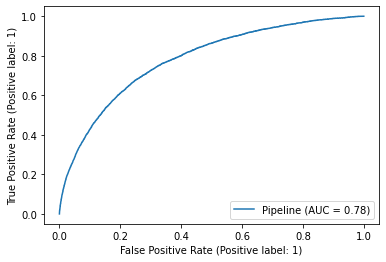

In [173]:
viz = plot_roc_curve(best_model, test_set.drop(columns='TARGET'), test_set["TARGET"] )
plt.show()

In [174]:
viz.roc_auc

0.7815933495306954

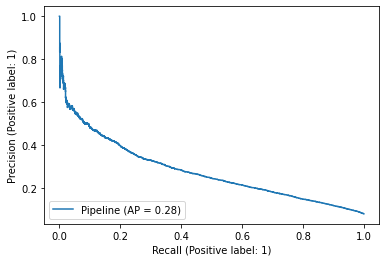

In [175]:
viz2 = plot_precision_recall_curve(best_model, test_set.drop(columns='TARGET'), test_set["TARGET"] )
plt.show()

In [176]:
viz2.average_precision

0.27888374041736436

In [177]:
# prédictions
proba_test_set = best_model.predict_proba(test_set.drop(columns='TARGET'))
predictions = pd.DataFrame(index= test_set.index)
predictions['proba_0'] = proba_test_set[:,0]
predictions['proba_1'] = proba_test_set[:,1]
predictions.loc[predictions['proba_1'] > 0.48, 'pred'] = 1
predictions['pred'] = predictions['pred'].fillna(0)

In [178]:
# scores
scores_test = pd.DataFrame(index = ['best model'])
scores_test.loc['best model', 'F2-score'] = fbeta_score(test_set["TARGET"], predictions["pred"], beta=2)
scores_test.loc['best model', 'recall'] = recall_score(test_set["TARGET"], predictions["pred"])
scores_test.loc['best model', 'précision'] = precision_score(test_set["TARGET"], predictions["pred"])
scores_test.loc['best model', 'balanced_acc'] = balanced_accuracy_score(test_set["TARGET"], predictions["pred"])
scores_test

,F2-score,recall,précision,balanced_acc
best model,0.446435,0.714602,0.178498,0.712891


Les scores sont similaires à ceux retrouvés lors des cross-validations. Ce modèle est donc généralisable.

In [179]:
# matrice de confusion
confusion_matrix(test_set["TARGET"], predictions["pred"])

array([[40208, 16329],
       [ 1417,  3548]])

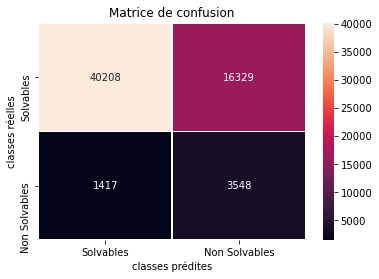

In [180]:
mx_confusion = pd.DataFrame(confusion_matrix(test_set["TARGET"], predictions["pred"]),
                            columns=['Solvables', 'Non Solvables'],
                            index=['Solvables', 'Non Solvables'])

sns.heatmap(mx_confusion, annot=True, fmt='g', linewidths=.7)
plt.title("Matrice de confusion")
plt.xlabel("classes prédites")
plt.ylabel("classes réelles")
plt.show()

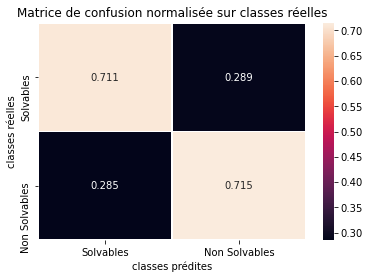

In [181]:
mx_confusion2 = pd.DataFrame(confusion_matrix(test_set["TARGET"], predictions["pred"], normalize='true'),
                            columns=['Solvables', 'Non Solvables'],
                            index=['Solvables', 'Non Solvables'])

sns.heatmap(np.round(mx_confusion2, 3), annot=True, fmt='g',linewidths=.7)
plt.title("Matrice de confusion normalisée sur classes réelles")
plt.xlabel("classes prédites")
plt.ylabel("classes réelles")
plt.show()

## 2. Lime : Explication du modèle au niveau local

In [182]:
## lime
from lime.lime_tabular import LimeTabularExplainer

In [183]:
# Transformation du jeu test
x_test_transformed = pd.DataFrame(best_model[0].transform(test_set.drop(columns="TARGET")),
                          columns=name_features,
                          index=test_set.index)

lime1 = LimeTabularExplainer(x_test_transformed,
                             feature_names=name_features,
                             class_names=["Solvable", "Non Solvable"],
                             discretize_continuous=False, random_state=42)
                            

exp = lime1.explain_instance(x_test_transformed.iloc[50],
                             best_model[1].predict_proba,
                             num_samples=1000)

In [184]:
predictions.iloc[50]

proba_0    0.594674
proba_1    0.405326
pred       0.000000
Name: 311906, dtype: float64

In [185]:
# Affichage des résultats lime
exp.show_in_notebook()

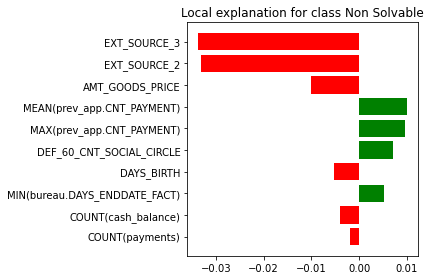

In [186]:
exp.as_pyplot_figure()
plt.tight_layout()

Selon les graphiques, nous pouvons voir que ce client est prédit comme solvable. Nous pouvons également voir que les variables ext_source_2 et ext_source_3 semblent principalement avoir influencé cette prédiction en faveur de la classe solvable.

In [187]:
exp.as_list()

[('EXT_SOURCE_3', -0.03376360936115391),
 ('EXT_SOURCE_2', -0.03314059711482611),
 ('AMT_GOODS_PRICE', -0.010164330649956197),
 ('MEAN(prev_app.CNT_PAYMENT)', 0.010018942895579532),
 ('MAX(prev_app.CNT_PAYMENT)', 0.009536723662730352),
 ('DEF_60_CNT_SOCIAL_CIRCLE', 0.007010801851246692),
 ('DAYS_BIRTH', -0.005259805087196952),
 ('MIN(bureau.DAYS_ENDDATE_FACT)', 0.005232441441590879),
 ('COUNT(cash_balance)', -0.004085082329538321),
 ('COUNT(payments)', -0.0018325623991528271)]

# VI. Application sur les données non étiquetées (df_app2)

Ce jeu de données sera utilisé pour le dashboard.
Nous pouvons utiliser le modèle que nous avons optimisé précédemment afin de pouvoir prédire les classes Solvable/Non solvable pour ce nouveau jeu de données.

In [188]:
proba_app = best_model.predict_proba(df_app2)
predictionsT = pd.DataFrame(index= df_app2.index)
predictionsT['proba_0'] = proba_app[:,0]
predictionsT['proba_1'] = proba_app[:,1]
predictionsT.loc[predictionsT['proba_1'] > 0.48, 'pred'] = 1
predictionsT['pred'] = predictionsT['pred'].fillna(0)

In [189]:
predictionsT

,proba_0,proba_1,pred
SK_ID_CURR,,,
100001,0.595961,0.404039,0.0
100005,0.288619,0.711381,1.0
100013,0.843245,0.156755,0.0
100028,0.695126,0.304874,0.0
100038,0.301556,0.698444,1.0
...,...,...,...
456221,0.794733,0.205267,0.0
456222,0.584871,0.415129,0.0
456223,0.823454,0.176546,0.0


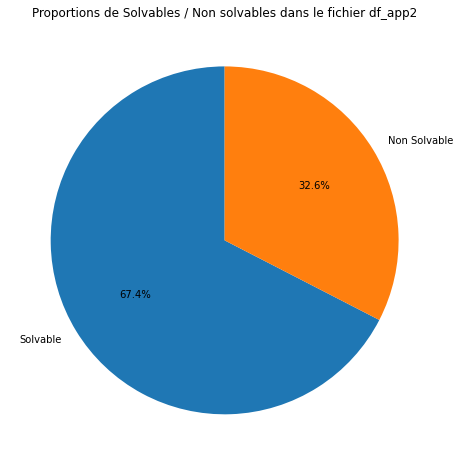

In [190]:
# pred
plt.figure(figsize = (8, 8))
# % de valeurs 'TARGET' différentes
x = predictionsT['pred'].value_counts()/len(predictionsT)*100
# Pieplot 
plt.pie(x,
        autopct='%1.1f%%',
        labels=["Solvable", "Non Solvable"],
        startangle=90)
plt.title("Proportions de Solvables / Non solvables dans le fichier df_app2")
plt.show()

## VII. Sauvegarde du modèle

In [191]:
import pickle
filename = 'scoring_model_f2.sav'
pickle.dump(best_model, open(filename, 'wb'))

In [192]:
# Svg des données app
df_app2.to_csv("app_test.csv")

In [193]:
df_app2.shape

(48744, 193)

# Annexes : Essai figures pour le dashboard

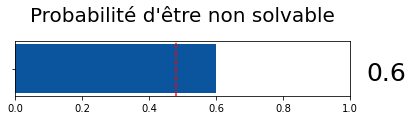

In [194]:
data_to_plot = ("Example 1", 0.4, 0.6)
palette = sns.color_palette("Blues_r")
fig, ax = plt.subplots(figsize=(6,1))
ax.set_yticks([1])
#ax.set_yticklabels([data_to_plot[0]])
ax.set_yticklabels('')
ax.set_xlim(0,1)
ax.barh([1], [data_to_plot[2]], height=10, color=palette)
ax.axvline(0.48,  color='r', ls='--', alpha=0.9)
for i, v in enumerate([data_to_plot[2]]):
    #ax.text(105, i , str(v), color='black', fontweight='bold', size=20)
    ax.text(1.05, 0.1, str(v), color='black', size=25, verticalalignment='center')
ax.set_title("Probabilité d'être non solvable", size=20, pad=20)
plt.show()

In [196]:
import plotly.graph_objects as go
fig = go.Figure()

fig.add_trace(go.Box(
    y=[0.2, 0.2, 0.6, 1.0, 0.5, 0.4, 0.2, 0.7, 0.9, 0.1, 0.5, 0.3],
    boxpoints=False,
    boxmean=True,
    name='essai'))

fig.add_hline(y=0.5, line_width=3, line_color="red")

fig.update_layout(
    autosize=False,
    width=500,
    height=500)

fig.show()